In [2]:
from sklearn.datasets import load_digits
import matplotlib.pyplot as plt
import numpy as np

In [3]:
from sklearn.cluster import MiniBatchKMeans

In [4]:
digits = load_digits()

In [9]:
print(digits.data.shape)

(1797, 64)


digits.data contains the number of samples and the dimensions of the dataset.

digits.target contains the classification label(0-9) for each of the digits.data.

digits.target_names contains the unique class labels.

digits.images contains the images for each digits.data.

We have 1797 images in our data set.

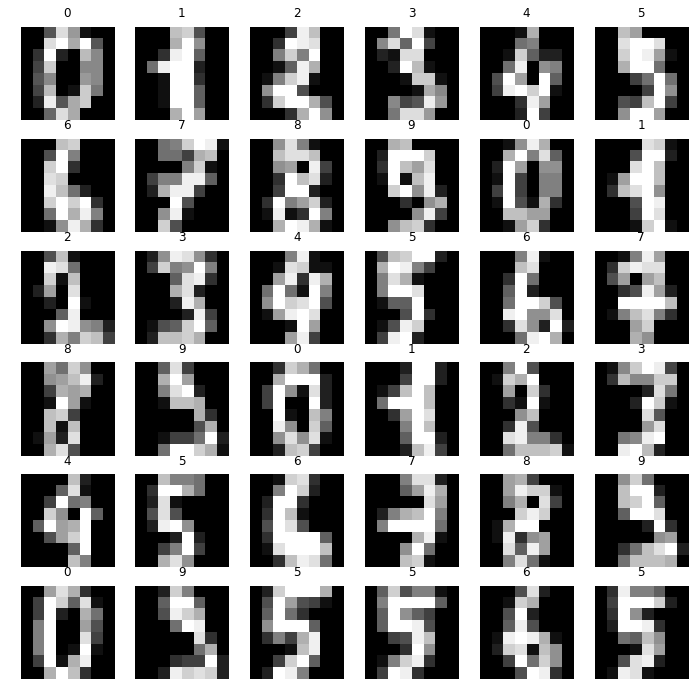

In [5]:
fig, axs = plt.subplots(6, 6, figsize = (12, 12))

for i, ax in enumerate(axs.flat):
    plt.gray() 
    ax.matshow(digits.images[i]) 
    ax.axis('off')
    ax.set_title(digits.target[i])
plt.show() 

In [6]:
# number of clusters
# initially, we choose as K the number of unique labels, so the number of items in target_names list
#K = len(digits.target_names)

K = 15
print(K)

15


In [7]:
# number of samples and features for the data
samples, features = digits.data.shape

In [8]:
X = digits.data
print(X)

[[ 0.  0.  5. ...  0.  0.  0.]
 [ 0.  0.  0. ... 10.  0.  0.]
 [ 0.  0.  0. ... 16.  9.  0.]
 ...
 [ 0.  0.  1. ...  6.  0.  0.]
 [ 0.  0.  2. ... 12.  0.  0.]
 [ 0.  0. 10. ... 12.  1.  0.]]


In [9]:
# compares if 2 lists with many duplicates are identical
import collections
compare =  lambda x, y: collections.Counter(x) == collections.Counter(y)

We compute the euclidean distance between each data point (data from load_digits) and each of the K centroids. 
We choose the minimum distance centroid for each data point. 
In the first step we need to find K random points, which will form the initial centroids for our clusters.

In [10]:
# we are going to create random initial centroids for our clusters
Centroids=np.array([]).reshape(features,0) 

In [11]:
import random as rd

Each column of the Centroid will be created by a data sample (X[rand]) from a random index (rand). In total, we will have 
K columns, each corresponding to a cluster. 
We need np.c_ to 'convert' rows (samples) from data to columns of the centroids matrix.

In [12]:
for i in range(K):
    # get a random number, i.e. a random sample index
    # X[rand] is a sample from the data
    rand=rd.randint(0,samples-1)
    Centroids=np.c_[Centroids,X[rand]]

We find the euclidian distance from each data point (samples) to all the K centroids and store in a (samples, K) matrix. We will use the minimal distance for each point in the number of samples we have, in order to add it in the right cluster.

In [13]:
def euclidean(X, K, samples, Centroids):
    Distance=np.array([]).reshape(samples,0)
    
    for k in range(K):
        # from the formula for Euclidian distance
        # temp is a vector with number of columns = number of samples
        # so we get the euclidean distance for each sample
        # and we repeat for every cluster K
        temp=np.sum((X-Centroids[:,k])**2,axis=1)
        # each Distance column (K in total) will contain the distances for every sample from each centroid K
        # therefore temp (distance for each sample) should become a new column in the Distance matrix
        # and we have as many rows as samples
        Distance=np.c_[Distance,temp]
    #print(Distance.shape)

    # keep the minimum distance cluster for each data point
    # i.e. the Distance column with the minimum value for each sample
    # do not forget that clusters numbers are from 1 to K, so don't forget to +1
    C=np.argmin(Distance,axis=1)+1
    return C

We need to create an output dictionary Y with K rows (keys) and indices K+1 (from 1-K) to indicate the corresponding cluster number 1-K.
Each row of Y will contain initially a key which will be a vector of number of rows = features.

Now, for each sample we need to find to which cluster it corresponds (from matrix C): for i in sample, we have a unique C[i]
that assigns the i-th sample to a unique cluster 1-K.
In the same time, this cluster number C[i] is an index of Y.

So, we can assign any sample to the corresponding Y[C[i]], depending on the cluster this sample belongs. Do not forget that
X[i] is a sample of X with 64 columns(=number of features), so X[i] is a vector of 64 rows.

In the end, every row of Y will contain all the corresponding Xs. Each Y[k] will have number of rows = number of features, 
as each sample has 64 rows, and number of columns = number of samples that correspond to this cluster (k = C[sample] for all
samples in Y[k]).

Y[k] will reform as many times as we wish, and we define this number of repetitions.

The centroids will change in every regrouping. Any new centroid will be the average value (np.mean()) of all samples in 
this certain cluster Y. So, for each cluster k, we update the corresponding Centroids column by np.mean(Y[k]). Do not forget to add +1 when we repeat in range(k) (from 0 to K-1).

The output of our algorithm should be a dictionary with cluster number as Keys and the data points which belong to that cluster as values. This final output will be the last Y formation after all the repetitions.

In [14]:
Output={}      # final clustering

In [15]:
indices = {}

In [36]:
def Regroup(X, K, C, Centroids, samples, features):
    Y={}              # keep our temporary output here
    index = {}        # We are going to store the indices from the initial dataset that correspond to each cluster K
    
    for k in range(K):
        # k 'keys' = number of clusters
        Y[k+1]=np.array([]).reshape(features,0)
        index[k+1] = []
        
    for i in range(samples):
        # assign the sample to the Y[k], where k=C[i]
        # in the end the 'values' of the dictionary will be the Xs of each cluster, where each key corresponds to a cluster
        Y[C[i]]=np.c_[Y[C[i]],X[i]]
        print('cluster',C[i], 'data', Y[C[i]])
        
        # We store the indices i that match the cluster C[i]
        index[C[i]].append(i)
        
    # compute the mean of cluster points for each cluster and assign it as new centroids
    for k in range(K):
        # Do not forget to transpose matrix Y (Y.T) otherwise it crashes!!
        Centroids[:,k]=np.mean(Y[k+1].T,axis=0)
        
    return Y, Centroids, index

In [37]:
#print(Y)

In [38]:
# Choose how many times we will regroup the samples in clusters
rep = 25

We need to recreate the clusters, taking initially as centroids the values of C for each sample.

In [39]:
for i in range(rep):
    C = euclidean(X, K, samples, Centroids)
    Y, Centroids, index = Regroup(X, K, C, Centroids, samples, features)

cluster 9 data [[ 0.]
 [ 0.]
 [ 5.]
 [13.]
 [ 9.]
 [ 1.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [13.]
 [15.]
 [10.]
 [15.]
 [ 5.]
 [ 0.]
 [ 0.]
 [ 3.]
 [15.]
 [ 2.]
 [ 0.]
 [11.]
 [ 8.]
 [ 0.]
 [ 0.]
 [ 4.]
 [12.]
 [ 0.]
 [ 0.]
 [ 8.]
 [ 8.]
 [ 0.]
 [ 0.]
 [ 5.]
 [ 8.]
 [ 0.]
 [ 0.]
 [ 9.]
 [ 8.]
 [ 0.]
 [ 0.]
 [ 4.]
 [11.]
 [ 0.]
 [ 1.]
 [12.]
 [ 7.]
 [ 0.]
 [ 0.]
 [ 2.]
 [14.]
 [ 5.]
 [10.]
 [12.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 6.]
 [13.]
 [10.]
 [ 0.]
 [ 0.]
 [ 0.]]
cluster 1 data [[ 0.]
 [ 0.]
 [ 0.]
 [12.]
 [13.]
 [ 5.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [11.]
 [16.]
 [ 9.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 3.]
 [15.]
 [16.]
 [ 6.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 7.]
 [15.]
 [16.]
 [16.]
 [ 2.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [16.]
 [16.]
 [ 3.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [16.]
 [16.]
 [ 6.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [16.]
 [16.]
 [ 6.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [11.]
 [16.]
 [10.]
 [ 0.]
 [ 0.]]
cluster 5 data [[ 0.]
 [ 0.]
 [ 0.]
 [ 4.]
 [15.]
 [12.]
 [ 0.]
 [ 0.]
 

cluster 5 data [[ 0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.]
 [ 0.  9. 10. 11.  0.  0.]
 [ 4. 14. 11. 10.  5.  3.]
 [15.  8.  4. 12. 14. 15.]
 [12.  1.  0.  4. 12. 10.]
 [ 0.  0.  0.  0.  2.  1.]
 [ 0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.]
 [ 3. 12. 10. 12.  7.  0.]
 [16. 14. 15. 13. 15. 11.]
 [15. 14. 13.  9.  8. 10.]
 [14. 12. 13. 16. 14. 16.]
 [ 0.  0.  1.  1.  4.  4.]
 [ 0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.]
 [ 8.  9.  8.  7.  6.  0.]
 [13. 10. 11. 13.  2. 12.]
 [ 8.  0.  0. 11.  3.  1.]
 [16. 15. 14. 16. 13. 15.]
 [ 0.  4.  4.  0.  1.  6.]
 [ 0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.]
 [ 1.  3.  0.  1.  0.  0.]
 [ 6. 16. 13. 16.  1.  3.]
 [15. 12. 15. 14. 13.  4.]
 [11. 14. 13.  4.  4. 15.]
 [ 0.  2.  0.  0.  0.  4.]
 [ 0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.]
 [ 1.  0.  1.  0.  0.  0.]
 [ 8.  4. 11. 10.  1.  0.]
 [13. 16. 16. 16. 11.  6.]
 [15. 16. 16.

 [ 0.  0.  0.]]
cluster 14 data [[ 0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.]
 [ 0.  2.  0.  1.  0.  0.  0.]
 [14. 16. 12. 11. 12. 14.  9.]
 [13. 16.  5.  9. 13.  7. 13.]
 [ 1.  2.  0.  0.  1.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.]
 [ 5.  4.  2.  7.  8. 13.  2.]
 [16. 16. 16. 16. 16. 16. 16.]
 [16. 16. 12. 13. 15.  9. 16.]
 [ 2.  2.  0.  0.  2.  0.  1.]
 [ 0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.]
 [ 0.  1.  0.  0.  0.  0.  0.]
 [ 0.  4.  1.  4. 10. 10.  0.]
 [14. 12. 12. 14. 16. 16.  5.]
 [16. 16. 16. 16. 16. 16.  9.]
 [12. 12. 11.  9. 12.  7. 15.]
 [ 0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.]
 [ 1.  7.  2. 10.  4.  7.  0.]
 [10. 16. 12. 16. 16. 16.  0.]
 [16. 16. 16. 11. 16.  8.  0.]
 [16. 16. 16. 16. 16. 16.  5.]
 [12. 12. 10.  8. 13.  2. 14.]
 [ 0.  0.  0.  0.  0.  0.  0.]
 [ 0.  

cluster 9 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 5.  1.  3. 10.  6.  2.  1.  2.  1. 10.  4.  1.]
 [13.  9. 13. 14. 14. 15. 15. 14. 13. 12. 14. 12.]
 [ 9. 15. 11. 11. 10. 13. 13. 15. 10. 10. 11.  5.]
 [ 1. 11.  7.  3.  2.  3.  1.  5.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  4.  0.  0.  0.  0.  7.  3.  3.  0.]
 [13. 11. 11. 16. 15. 10.  7. 10. 16. 16. 15.  9.]
 [15. 16. 16. 13. 15. 15. 16. 16. 16. 16. 15. 16.]
 [10.  8. 16.  6. 13. 11. 14. 16. 16. 16. 16. 14.]
 [15. 14. 16. 14. 15. 15.  8. 15.  7.  4.  9.  3.]
 [ 5.  6.  2.  1.  3.  0.  0.  1.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 3.  2.  4.  4.  2.  3.  8.  3.  8.  7.  8.  2.]
 [15. 16. 16. 16. 16. 16. 12. 16. 16. 15. 13. 16.]
 [ 2. 10.  9.  2

 [ 0.  0.  0.  0.  0.  0.  0.]]
cluster 6 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  1.  1.  0.  0.  0.  0.]
 [12.  6.  9.  2. 13.  9. 12.  9.  9.  0.  1.]
 [10. 14. 13. 13. 10. 16. 13. 13. 15. 12. 11.]
 [ 0.  4.  7.  8.  1. 13.  4. 14.  5. 14. 15.]
 [ 0.  0.  0.  0.  0.  7.  0.  5.  0.  1.  8.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  5.  7.  4.  4.  0.  0.  0.]
 [14. 11. 12.  6. 16. 14. 16. 16. 13.  9. 12.]
 [16. 16. 16. 16. 14.  4. 16. 10. 14. 16. 14.]
 [16. 10. 16. 16.  7. 10. 16. 13. 13. 10. 10.]
 [14.  0.  2.  6.  0. 12.  3. 16.  7.  5. 16.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  5.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  4.  6.  4.  0.  0.  0.  0.]
 [13.  8. 12.  5. 16. 15. 16. 13.  6.  8. 16.]
 [16. 14. 13. 15.  8.  9. 16. 15. 14. 13.  7.]
 [15. 16. 16.

 [0. 0. 0. ... 0. 0. 0.]]
cluster 5 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  9. 10. 11.  0.  0.  4.  0.  4.  0.  1.  5.  3.]
 [ 4. 14. 11. 10.  5.  3.  8.  1.  9.  8. 10. 12. 13.]
 [15.  8.  4. 12. 14. 15. 16.  9. 13. 15. 16. 13. 13.]
 [12.  1.  0.  4. 12. 10.  5. 11.  5.  8.  8.  2.  3.]
 [ 0.  0.  0.  0.  2.  1.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  3.  2.]
 [ 3. 12. 10. 12.  7.  0.  9.  0. 16.  3. 11. 16. 14.]
 [16. 14. 15. 13. 15. 11. 16. 13. 16. 16. 13. 14. 12.]
 [15. 14. 13.  9.  8. 10.  8. 16. 12. 12. 10. 16. 12.]
 [14. 12. 13. 16. 14. 16. 11. 16. 11. 16. 16. 13. 11.]
 [ 0.  0.  1.  1.  4.  4.  0.  0.  0.  4.  0.  1.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0

 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 7.  1.  0. ... 10.  7.  1.]
 ...
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  6.  1.  1.]
 [ 7.  9.  8. ... 16. 11. 10.]
 ...
 [ 9. 11.  2. ... 11.  1.  4.]
 [ 0.  0.  0. ...  1.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 2 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 5.  0.  6.  3.  1.  0.  2.  4.  4.  2.  5.  6.  2.  7.]
 [12. 12. 13. 15. 15. 15. 15. 16. 15. 14. 16. 16. 15. 16.]
 [13.  8.  5.  8.  4. 16. 16. 16. 16. 16. 16. 16. 16. 16.]
 [16.  8.  8.  8.  0. 16. 16. 16. 16. 16. 16. 16. 16. 16.]
 [16.  7.  8.  6.  0. 12. 14. 10. 16. 13. 11. 15. 13. 11.]
 [ 2.  0.  1.  0.  0.  2.  2.  3.  4.  5.  1. 10.  2.  2.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [11.  

cluster 1 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  1.  3.  5.  7.  2.  2.  0. 15.  8.  9.]
 [12.  1. 11. 11. 15.  6. 14. 13. 13. 13.  8. 15. 16. 16.]
 [13. 16. 16. 16. 13. 14. 15. 15. 13.  4. 13.  2. 13.  3.]
 [ 5.  5.  5.  8.  0.  5.  4.  5.  1.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  6.  1.  7.  8.  8.  8.  8.  1.  8.  7. 11.]
 [11.  5. 10. 16. 16. 15. 16. 16. 16. 14. 16. 15. 14. 16.]
 [16. 16. 16. 13. 16. 15. 16. 16. 14. 11. 16. 11. 16. 14.]
 [ 9. 11.  5.  3.  5. 13. 14. 12.  4.  0.  0.  0.  4.  1.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.

cluster 5 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  9. 10. ...  3.  2.  0.]
 ...
 [16. 11.  1. ...  7. 10. 13.]
 [ 9.  1.  0. ...  0.  0.  3.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 3 data [[ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [11. 11.  7.  3.]
 [12. 16. 16. 12.]
 [ 0.  8. 11.  5.]
 [ 0.  0.  1.  0.]
 [ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [ 2.  6.  1.  1.]
 [16. 16. 15. 15.]
 [16. 11. 12. 14.]
 [16. 13. 12. 16.]
 [13.  9. 12.  6.]
 [ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [ 3.  7.  2.  6.]
 [16. 16. 16. 16.]
 [12.  0.  2.  0.]
 [10.  9.  6.  6.]
 [14. 16. 16. 16.]
 [ 0.  0.  2.  6.]
 [ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [ 1.  2.  1.  5.]
 [16. 15. 16. 16.]
 [ 1. 12.  6. 11.]
 [12. 16.  6. 14.]
 [15. 16. 16. 16.]
 [ 0.  3.  6.  4.]
 [ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [13.  5.  7.  8.]
 [16.  7. 16. 10.]
 [ 9.  7. 15. 12.]
 [15. 16. 16. 16.]
 [ 2.  4.  9.  0.]
 [ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]

 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  2.  0.]
 [ 7.  9.  8. ...  7. 11.  7.]
 ...
 [ 9. 11.  2. ... 13. 11.  5.]
 [ 0.  0.  0. ...  2.  3.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 1. 3. 5.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  2.  0.  2.]
 [ 7.  9.  8. ... 11.  7. 13.]
 ...
 [ 9. 11.  2. ... 11.  5.  7.]
 [ 0.  0.  0. ...  3.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  2.  1.]
 [ 7.  9.  8. ...  7. 13. 10.]
 ...
 [ 9. 11.  2. ...  5.  7.  5.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 4 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  1.  0.  0.  0.  0.  1.  0.  1.]
 [ 9.

cluster 15 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 2.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  2.  0.]
 [13. 13. 13. 12.  6.  6. 11.  6.  3.  6.  2.  5.  5. 12.  7.]
 [16. 15. 13. 16. 13.  8.  7.  8.  8. 14. 10.  8. 11. 13. 11.]
 [16. 12.  8. 16.  2. 12. 12.  8.  9. 14. 16. 12. 16. 16. 12.]
 [16. 12.  2.  8.  0. 14. 15. 13.  9. 13.  4. 16. 12. 15. 14.]
 [11.  5.  0.  0.  0.  0.  1.  3.  0. 11.  0.  4.  0.  1.  2.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.]
 [ 5.  4.  5.  3.  4.  5.  1.  1.  6.  0. 10.  3.  0.  8.  8.]
 [16. 16. 16. 16. 16. 16. 16. 14. 16. 14. 16. 16. 16. 16. 16.]
 [10.  8. 16. 13. 16. 15. 14. 14. 12. 12. 16. 11. 12. 14.  9.]
 [ 5.  8. 16.  8. 16. 12.  9. 12.  8.  5. 15.  7.  4. 11.  4.]
 [ 4.  6. 12.  5. 11.  7.  6.  9.  5.  4.  4.  1.  3.  7.  3.]
 [ 1.  0.  0.  0.  0.  0.  0.  3.  0.  2.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  

 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  2.  1.  1.]
 ...
 [11. 16. 14. ...  7.  9.  7.]
 [ 3. 11.  7. ...  0.  1.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  0.  0.]
 [ 7.  9.  8. ... 10.  3. 11.]
 ...
 [ 9. 11.  2. ... 10.  8.  2.]
 [ 0.  0.  0. ...  1.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ...  3.  4. 10.]
 ...
 [ 0.  3.  4. ...  6.  0.  4.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 3 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [11. 11.  7.  3.  1.  6.  7.  4.  4.  3.  1.  1.  5.  9.]
 [12. 16. 16. 12. 10. 12. 13. 13. 13. 12.  6. 11. 14. 16.]
 [ 0.  8. 11.  5. 13. 13. 16. 16. 15. 15.  8. 14. 11. 11.]
 [ 0.  0.  1.  0. 13.  5.  7. 14.  9

cluster 2 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  0.  6. ...  4.  1.  0.]
 [12. 12. 13. ... 10.  8. 11.]
 ...
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 2. 2. 2.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [12.  6.  9. ... 10.  4.  3.]
 ...
 [10. 13. 12. ...  8. 11.  9.]
 [ 0. 11. 11. ...  0.  2.  1.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  2.  1.  0.]
 [13. 13. 13. ... 16.  8.  3.]
 ...
 [ 0.  0.  6. ...  0.  4.  2.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 11 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [4. 4. 8. ... 8. 6. 3.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 5 data [[ 0.  0.  0. ...  0

cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 ...
 [11. 16. 14. ... 16. 16. 16.]
 [ 3. 11.  7. ... 10. 10.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 5.  8. 13. ...  2.  4.  0.]
 ...
 [13. 12. 16. ... 15. 16. 16.]
 [12. 13. 12. ...  7. 15. 16.]
 [ 4.  1.  0. ...  1.  8. 16.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 4. 4. 4.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  0.  0.  0.]
 [13. 13. 13. ...  9.  8. 10.]
 ...
 [ 0.  0.  6. ...  7.  4.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 4 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 ...
 [2. 5. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 4 data [[0. 0. 0. ... 0. 0.

cluster 14 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 ...
 [16. 15.  8. ...  6.  6.  7.]
 [ 1.  4.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  0.  0.  0.]
 [13. 13. 13. ...  6.  6.  2.]
 ...
 [ 0.  0.  6. ...  0.  3.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 3 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [11. 11.  7. ...  3.  1.  9.]
 ...
 [ 3.  1.  6. ...  8. 11.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 3 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [11. 11.  7. ...  1.  9.  3.]
 ...
 [ 3.  1.  6. ... 11.  1. 16.]
 [ 0.  0.  0. ...  0.  0.  7.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 5.  8. 13. ...  8.  6.  4.]
 ...
 [13. 12. 16. ...  7.  1.  6.]
 [12. 13. 12. ...  1.  0.

cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  3.  0.  0.]
 ...
 [11. 16. 14. ... 14. 13. 13.]
 [ 3. 11.  7. ...  7. 12.  9.]
 [ 0.  0.  0. ...  0.  2.  1.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  5.  0.  2.]
 ...
 [10.  5.  8. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 0. 1. 1.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 2 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  0.  6. ...  0.  0.  0.]
 [12. 12. 13. ... 15.  8. 11.]
 ...
 [ 0.  0.  0. ...  0.  0.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 4 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [2. 5. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 4 data [[0. 0. 0. ... 0. 0. 0

cluster 9 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [5. 1. 3. ... 4. 9. 7.]
 ...
 [0. 3. 4. ... 2. 3. 3.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 2 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  0.  6. ...  0.  2.  0.]
 [12. 12. 13. ...  7. 13. 13.]
 ...
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  0.  0.]
 [ 7.  9.  8. ... 10.  7.  6.]
 ...
 [ 9. 11.  2. ... 10.  7. 12.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  2.  0.  0.]
 ...
 [11. 16. 14. ... 16. 15. 14.]
 [ 3. 11.  7. ...  2.  5.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [12.  6.  9. ...  7.  1.  2.]
 ...
 [10. 13. 12. ...  5.  6. 16.]
 [ 0. 11. 11. ...  0.  0.  2.]
 [ 0.  1.  0. ...  0.  0.  0.]]


cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ... 10. 10.  6.]
 ...
 [ 0.  3.  4. ...  7. 10.  3.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  0.  0.  3.]
 [13. 13. 13. ... 10. 12. 10.]
 ...
 [ 0.  0.  6. ...  5.  8.  2.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  0.  0.]
 [ 7.  9.  8. ...  2.  9. 14.]
 ...
 [ 9. 11.  2. ... 10. 10. 14.]
 [ 0.  0.  0. ...  0.  0.  2.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  2.]
 ...
 [11. 16. 14. ... 16. 16. 15.]
 [ 3. 11.  7. ... 13.  5.  4.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  1.]
 [12.  6.  9. ... 12.  3. 12.]
 ...
 [10. 13. 12. ...  7. 16. 16.]
 [ 0. 11. 11. ...  0.  4. 

cluster 4 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [2. 5. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ...  2.  5.  5.]
 ...
 [ 0.  3.  4. ... 13. 15.  4.]
 [ 0.  0.  0. ...  5.  3.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  1.  0.  1.]
 [13. 13. 13. ...  9.  0. 13.]
 ...
 [ 0.  0.  6. ...  1.  2.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  1.  1.  1.]
 [ 7.  9.  8. ... 10. 10. 13.]
 ...
 [ 9. 11.  2. ...  9.  7. 11.]
 [ 0.  0.  0. ...  1.  0.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  1.  0.  2.]
 ...
 [11. 16. 14. ... 16. 15. 16.]
 [ 3. 11.  7. ... 13.  4.  4.]
 [ 0.  0.  0. ...  1.  0.  0.]]

cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  1.  0.  0.]
 ...
 [11. 16. 14. ... 14. 14. 13.]
 [ 3. 11.  7. ...  2.  5. 10.]
 [ 0.  0.  0. ...  0.  0.  1.]]
cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  2.  0.]
 [10.  7.  6. ...  5.  9. 11.]
 ...
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 11 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [4. 4. 8. ... 0. 2. 3.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  1.  0.]
 [ 7.  9.  8. ... 10.  7.  5.]
 ...
 [ 9. 11.  2. ... 10. 16. 11.]
 [ 0.  0.  0. ...  0.  7.  3.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  4.  3.  3.]
 ...
 [10.  5.  8. ...  0.  4.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]

cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  1.  1.  2.]
 ...
 [10.  5.  8. ...  7. 11.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  0.  1.]
 [ 7.  9.  8. ... 13. 10. 12.]
 ...
 [ 9. 11.  2. ... 15.  3. 13.]
 [ 0.  0.  0. ...  1.  0.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [12.  6.  9. ...  0.  8.  8.]
 ...
 [10. 13. 12. ... 15. 10. 15.]
 [ 0. 11. 11. ...  2.  0.  1.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  1.  2.  2.]
 ...
 [10.  5.  8. ... 11.  0. 11.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  1.  1.  0.]
 [ 7.  1.  0. ... 12.  8.  3.]
 ...
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  

cluster 4 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [2. 5. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  2.  0.  0.]
 ...
 [11. 16. 14. ... 16.  9. 15.]
 [ 3. 11.  7. ...  7.  0.  3.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  1.  1.  0.]
 [ 7.  9.  8. ... 12.  9. 13.]
 ...
 [ 9. 11.  2. ... 11.  9. 10.]
 [ 0.  0.  0. ...  1.  1.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 14 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 ...
 [16. 15.  8. ... 16. 13. 16.]
 [ 1.  4.  0. ...  8.  2.  6.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  1.  0.  0.]
 [ 7.  9.  8. ...  9. 13. 11.]
 ...
 [ 9. 11.  2. ...  9. 10. 12.]
 [ 0.  0.  0. ...  1.  0.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]

 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  1.]
 [10.  7.  6. ...  8. 10. 11.]
 ...
 [ 0.  0.  0. ...  5.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  1.  0.]
 [10.  7.  6. ... 10. 11.  5.]
 ...
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 ...
 [11. 16. 14. ... 12. 16. 12.]
 [ 3. 11.  7. ...  2.  4.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  1.  0.]
 [ 7.  9.  8. ...  6. 11.  6.]
 ...
 [ 9. 11.  2. ...  9.  6. 12.]
 [ 0.  0.  0. ...  6.  0.  1.]
 [ 0.  0.  0. ...  2.  0.  0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 ...
 [10.  5.  8. ...  0.  0

cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  4.  2.  0.]
 [ 5.  8. 13. ... 15. 11. 11.]
 ...
 [13. 12. 16. ...  0.  0.  4.]
 [12. 13. 12. ...  0.  0.  1.]
 [ 4.  1.  0. ...  0.  0.  0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  4.  6.  4.]
 ...
 [10.  5.  8. ...  5.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  6.  4.  1.]
 ...
 [10.  5.  8. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 11 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [4. 4. 8. ... 0. 3. 7.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  3.  0.  0.]
 ...
 [11. 16. 14. ... 13. 14. 12.]
 [ 3. 11.  7. ...  4.  4.  8.]
 [ 0.  0.  0. ...  0.  0.  0.]]

 [ 0.  0.  0.  0.  0.  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0.  0.  0.  0.  0.]
 [ 0.  2.  1.  0.  1.  0.  0.]
 [ 7.  9.  8.  9. 10. 10. 14.]
 [15. 15. 12. 16. 15. 15. 16.]
 [13. 14. 15. 13. 11. 14. 14.]
 [ 1.  9. 14.  6.  1.  4.  6.]
 [ 0.  3.  4.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.]
 [ 8.  4.  3.  0.  3.  0.  0.]
 [13. 13. 11.  6.  8.  4.  7.]
 [ 6.  8.  8.  5.  8.  6. 10.]
 [15.  9.  8. 16. 11. 13. 16.]
 [ 4. 16. 12. 16. 12. 16. 16.]
 [ 0.  8. 12.  0.  0.  2.  3.]
 [ 0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.]
 [ 2.  0.  0.  0.  0.  0.  0.]
 [ 1.  0.  0.  0.  0.  0.  0.]
 [13.  6.  0.  8.  5.  3.  5.]
 [13. 14.  2. 15. 14. 16. 16.]
 [ 0. 15. 13.  5. 15.  9. 16.]
 [ 0.  3.  7.  0.  1.  0.  1.]
 [ 0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.]
 [ 2.  0.  0.  0.  0.  0.  0.]
 [15. 11.  2.  5. 11.  1.  2.]
 [11. 14. 15. 14. 15. 16. 16.]
 [ 1.  2. 12.  3.  2.  6.  8.]
 [ 0.  0.  1.  0. 

cluster 14 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  2.  0.  1.  0.  0.  0.  0.  1.]
 [14. 16. 12. 11. 12. 14.  9. 11. 14.]
 [13. 16.  5.  9. 13.  7. 13. 15. 13.]
 [ 1.  2.  0.  0.  1.  0.  0.  4.  1.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 5.  4.  2.  7.  8. 13.  2.  3.  1.]
 [16. 16. 16. 16. 16. 16. 16. 16. 16.]
 [16. 16. 12. 13. 15.  9. 16. 16. 16.]
 [ 2.  2.  0.  0.  2.  0.  1. 12.  3.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  1.  0.  0.  0.  0.  0.  0.  5.]
 [ 0.  4.  1.  4. 10. 10.  0.  0. 11.]
 [14. 12. 12. 14. 16. 16.  5.  8. 15.]
 [16. 16. 16. 16. 16. 16.  9. 14. 16.]
 [12. 12. 11.  9. 12.  7. 15. 16. 16.]
 [ 0.  0.  0.  0.  0.  0.  0. 12.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 1.  7.

cluster 7 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 7.  1.  0.  0.  9.  3.  0.  6.  3.  2.  3.  2.  3.  9.]
 [ 8.  8.  8.  9. 16. 12.  1. 13. 14.  7. 12. 11. 11. 12.]
 [13. 15. 14. 15. 16. 16. 14. 16. 16. 15. 16. 16. 16. 15.]
 [16. 10. 14. 12. 16. 16. 14.  6. 14. 13. 10.  4. 13. 15.]
 [15.  0.  2.  0.  5.  6.  3.  0.  0.  1.  0.  0.  0.  2.]
 [ 1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  3.  0.  0.  1.  0.  0.  3.  0.  0.  2.  0.  3.  1.]
 [ 7. 13.  0.  4. 14. 10.  0. 16. 13. 14. 14. 12. 15. 15.]
 [ 7. 15.  6.  7. 10. 11. 10. 14. 13. 12. 12.  9. 15. 14.]
 [ 4. 14. 10.  7.  8.  7. 11. 15. 13.  9. 12. 11. 13. 11.]
 [11. 14. 15. 14. 16. 16. 13. 16. 16. 14. 12. 15. 16. 16.]
 [12.  0. 11.  0.  8. 11.  8.  1.  2.  8.  0.  1.  0.  7.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.

cluster 11 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 1.  8.  0.  6.  3.  2.  3.  5.  3.]
 [11. 15. 12. 16. 14. 13. 16. 14. 16.]
 [ 0.  1.  2.  4.  1.  0.  3.  0.  3.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  1.  0.  1.  0.  0.  0.  1.  0.]
 [ 7. 14.  6. 13. 13.  8. 12. 15. 10.]
 [ 8. 13. 14. 15. 12. 15. 16. 13. 16.]
 [ 0.  1.  1.  1.  1.  0.  2.  0. 11.]
 [ 0.  1.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  1.  0.  0.  0.  0.  0.]
 [ 1. 10.  4. 11.  7.  5.  8.  9.  4.]
 [13. 15. 16. 16. 16. 16. 16. 16. 16.]
 [ 6.  3.  7.  5.  5.  5. 16. 13. 16.]
 [ 2. 15.  8.  0.  3.  2.  4.  0.  8.]
 [ 2. 11.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  7.

cluster 2 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  0.  6. ...  7.  2.  4.]
 [12. 12. 13. ... 16. 16. 16.]
 ...
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  1.  0.  2.  0.  0.  0.  1.  0.  0.  0.]
 [ 5.  8. 13.  2. 15. 13.  6.  7. 12. 11.  9.  3.]
 [12. 16. 15. 16. 16. 14. 13. 15. 14. 12. 16. 13.]
 [ 1.  5.  2. 13.  6.  8. 10. 15. 10.  0.  5. 12.]
 [ 0.  0.  0.  1.  0.  1.  3.  4.  0.  0.  0.  2.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  1.  6.  0.  5.  1.  5.  8.  5.  7.  6.  0.]
 [15. 13. 15.  6. 16. 16. 15. 16. 16. 16. 16. 14.]
 [14. 11. 15. 15. 15. 16. 11. 16. 16. 16. 16. 13.]
 [ 7. 16.  9. 16. 14. 16. 16. 16. 16.  5. 15. 15.]
 [ 0.  0.  0.  7.  0.  6. 11.  4.  4.  0.  0. 11.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0

 [ 0.  0.  0.  0.]]
cluster 5 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  9. 10. ...  2.  0.  5.]
 ...
 [16. 11.  1. ... 10. 13.  8.]
 [ 9.  1.  0. ...  0.  3.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 9 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [5. 1. 3. ... 4. 2. 4.]
 ...
 [0. 3. 4. ... 5. 5. 1.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  2.  0.]
 ...
 [10.  5.  8. ...  2.  5.  4.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  2.  0.  0.]
 [ 5.  8. 13. ... 15.  4.  6.]
 ...
 [13. 12. 16. ...  9. 15. 14.]
 [12. 13. 12. ...  1.  4. 13.]
 [ 4.  1.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  1.  2.  0.]
 [ 7.  9.  8. ... 12. 11. 10.]
 ...
 [ 9. 11.  2. ...  1.  0.  9.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  

 [0. 0. 0. ... 0. 0. 0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 5. 0. 3.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 15 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 2.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [13. 13. 13. 12.  6.  6. 11.  6.  3.  6.  2.  5.]
 [16. 15. 13. 16. 13.  8.  7.  8.  8. 14. 10.  8.]
 [16. 12.  8. 16.  2. 12. 12.  8.  9. 14. 16. 12.]
 [16. 12.  2.  8.  0. 14. 15. 13.  9. 13.  4. 16.]
 [11.  5.  0.  0.  0.  0.  1.  3.  0. 11.  0.  4.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.]
 [ 5.  4.  5.  3.  4.  5.  1.  1.  6.  0. 10.  3.]
 [16. 16. 16. 16. 16. 16. 16. 14. 16. 14. 16. 16.]
 [10.  8. 16. 13. 16. 15. 14. 14. 12. 12. 16. 11.]
 [ 5.  8. 16.  8. 16. 12.  9. 12.  8.  5. 15.  7.]
 [ 4.  6. 12.  5. 11.  7.  6.  9.  5.  4.  4.  1.]
 [ 1.  0.  0.  0.  0.  0.  0.  3.  0.  2.  0.  0.]
 [ 0.  0.  0.  0.  0. 

cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  2.  2.]
 ...
 [11. 16. 14. ... 12. 10. 12.]
 [ 3. 11.  7. ...  4.  0.  6.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 11 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [4. 4. 8. ... 0. 0. 3.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [12.  6.  9. ...  3.  5. 10.]
 ...
 [10. 13. 12. ... 11. 10.  8.]
 [ 0. 11. 11. ...  1.  0.  0.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 14 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 ...
 [16. 15.  8. ... 13. 11. 16.]
 [ 1.  4.  0. ...  0.  2.  7.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  1.  0.  0.]
 [13. 13. 13. ...  8.  3.  4.]
 ...
 [ 0.  0.  6. ...  5.  1.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]

cluster 3 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [11. 11.  7. ...  2.  2.  0.]
 ...
 [ 3.  1.  6. ...  3. 16. 16.]
 [ 0.  0.  0. ...  0.  6. 11.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [12.  6.  9. ...  3.  1.  0.]
 ...
 [10. 13. 12. ... 15. 16. 16.]
 [ 0. 11. 11. ...  0. 13.  9.]
 [ 0.  1.  0. ...  0.  3.  0.]]
cluster 4 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [2. 5. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  2.  3.  0.]
 ...
 [11. 16. 14. ... 16. 15. 15.]
 [ 3. 11.  7. ... 10.  0.  1.]
 [ 0.  0.  0. ...  3.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  3.  0.  0.]
 ...
 [11. 16. 14. ... 15. 15. 16.]
 [ 3. 11.  7. ...  0.  1.  7.]
 [ 0.  0.  0. ...  0.  0.  0.]]
c

cluster 3 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [11. 11.  7. ...  6.  3.  1.]
 ...
 [ 3.  1.  6. ...  7.  8. 11.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  1.  4.  2.]
 ...
 [11. 16. 14. ...  9. 14. 13.]
 [ 3. 11.  7. ...  2.  3.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  0.  0.]
 [ 7.  9.  8. ...  4.  6.  6.]
 ...
 [ 9. 11.  2. ...  8.  6.  8.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  0.  1.]
 [ 7.  9.  8. ...  6.  6.  7.]
 ...
 [ 9. 11.  2. ...  6.  8.  7.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 0. 1. 1.]
 ...
 [0. 0. 1. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  4.  5. 10.]
 ...
 [10.  5.  8. ... 12.  8.  0.]
 [ 0.  0.  0. ...  1.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 3 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [11. 11.  7. ...  2.  2.  0.]
 ...
 [ 3.  1.  6. ... 11. 10. 12.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  3.  3.]
 [ 5.  8. 13. ... 12. 15. 15.]
 ...
 [13. 12. 16. ... 12. 13. 12.]
 [12. 13. 12. ...  1.  3.  3.]
 [ 4.  1.  0. ...  0.  0.  0.]]
cluster 9 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [5. 1. 3. ... 6. 2. 7.]
 ...
 [0. 3. 4. ... 5. 1. 2.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  3.  3.  0.]
 [ 5.  8. 13. ... 15. 15. 14.]
 ...
 [13. 12. 16. ... 13. 12. 16.]
 [12. 13. 12. ...  3.  3. 16.]
 [ 4.  1.  0. ...  0.  0.  9.]]

cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  2.  0.  3.]
 [ 5.  8. 13. ... 13. 10. 15.]
 ...
 [13. 12. 16. ... 16. 16. 16.]
 [12. 13. 12. ... 16. 16. 16.]
 [ 4.  1.  0. ...  3. 14.  2.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 7. 0. 7.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 3 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [11. 11.  7. ...  1.  0.  7.]
 ...
 [ 3.  1.  6. ... 12. 11. 12.]
 [ 0.  0.  0. ...  1.  0.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  3.  1.]
 [ 5.  8. 13. ... 10. 15. 13.]
 ...
 [13. 12. 16. ... 16. 16. 16.]
 [12. 13. 12. ... 16. 16. 16.]
 [ 4.  1.  0. ... 14.  2. 11.]]
cluster 9 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [5. 1. 3. ... 3. 6. 3.]
 ...
 [0. 3. 4. ... 5. 4. 5.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 10 data [[ 0.  0.  0. ...  

cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  2.]
 [ 5.  1.  3. ...  0.  0.  0.]
 ...
 [ 0.  3.  4. ... 11. 14. 16.]
 [ 0.  0.  0. ...  0.  5.  7.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 5. 2. 6.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [10.  7.  6. ...  7. 14.  9.]
 ...
 [ 0.  0.  0. ... 10.  1.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 5.  8. 13. ...  8. 13. 11.]
 ...
 [13. 12. 16. ... 16. 16. 13.]
 [12. 13. 12. ... 15. 16. 16.]
 [ 4.  1.  0. ...  2.  9.  8.]]
cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  2.  0.]
 [ 5.  1.  3. ...  0.  0.  6.]
 ...
 [ 0.  3.  4. ... 14. 16. 12.]
 [ 0.  0.  0. ...  5.  7.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]

cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  1.  3.  0.]
 [13. 13. 13. ...  7. 16.  2.]
 ...
 [ 0.  0.  6. ...  3.  0.  5.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  7.  0.]
 ...
 [10.  5.  8. ...  2.  8.  5.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 9 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 2.]
 [5. 1. 3. ... 9. 7. 8.]
 ...
 [0. 3. 4. ... 0. 3. 1.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 9 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 2. 0.]
 [5. 1. 3. ... 7. 8. 8.]
 ...
 [0. 3. 4. ... 3. 1. 1.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  2.  1.]
 [ 5.  8. 13. ... 11. 10. 13.]
 ...
 [13. 12. 16. ... 16.  3. 11.]
 [12. 13. 12. ... 16.  0.  4.]
 [ 4.  1.  0. ...  6.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  

 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 11 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [4. 4. 8. ... 6. 1. 5.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  3.  0.  0.]
 ...
 [10.  5.  8. ...  0.  2.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 5. 9. 3.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 9. 3. 6.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  1.  0.]
 [ 7.  9.  8. ...  4. 13.  9.]
 ...
 [ 9. 11.  2. ... 11. 11. 16.]
 [ 0.  0.  0. ... 11.  1.  6.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  

cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  1.  0.]
 [12.  6.  9. ...  8. 11.  9.]
 ...
 [10. 13. 12. ... 13.  8.  7.]
 [ 0. 11. 11. ...  2.  1.  0.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 3 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [11. 11.  7. ...  3.  1.  1.]
 ...
 [ 3.  1.  6. ... 12. 13.  7.]
 [ 0.  0.  0. ...  0.  1.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  1.  0.  1.]
 [12.  6.  9. ... 11.  9. 14.]
 ...
 [10. 13. 12. ...  8.  7. 10.]
 [ 0. 11. 11. ...  1.  0.  1.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 3 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [11. 11.  7. ...  1.  1.  2.]
 ...
 [ 3.  1.  6. ... 13.  7.  6.]
 [ 0.  0.  0. ...  1.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 11 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [4. 4. 8. ... 6. 2. 2.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 ...
 [11. 16. 14. ... 16. 10. 15.]
 [ 3. 11.  7. ... 11.  0.  6.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 2 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  0.  6. ...  0.  8.  0.]
 [12. 12. 13. ...  7. 13.  5.]
 ...
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 9 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [5. 1. 3. ... 2. 5. 2.]
 ...
 [0. 3. 4. ... 8. 5. 9.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [10.  7.  6. ... 10.  5.  0.]
 ...
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 5 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  9. 10. ...  2.  8.  0.]
 ...
 [16. 11.  1. ... 12.  1.  0.]
 [ 9.  1.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]


cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  0.  0.  0.]
 [13. 13. 13. ... 15.  4.  7.]
 ...
 [ 0.  0.  6. ...  0.  1.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 9 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [5. 1. 3. ... 7. 7. 4.]
 ...
 [0. 3. 4. ... 3. 4. 2.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [12.  6.  9. ...  4.  5. 12.]
 ...
 [10. 13. 12. ... 12.  9.  3.]
 [ 0. 11. 11. ...  1.  0.  0.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 5 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  1.  0.  0.]
 [ 0.  9. 10. ... 11. 15.  7.]
 ...
 [16. 11.  1. ...  1.  7. 16.]
 [ 9.  1.  0. ...  0.  0.  3.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [12.  6.  9. ...  5. 12.  9.]
 ...
 [10. 13. 12. ...  9.  3.  4.]
 [ 0. 11. 11. ...  0.  0.  0.]
 [ 0.  1.  0. ...  0.  0.  0.]]


cluster 9 data [[ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [ 5.  1.  3. 10.]
 [13.  9. 13. 14.]
 [ 9. 15. 11. 11.]
 [ 1. 11.  7.  3.]
 [ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [ 0.  0.  0.  4.]
 [13. 11. 11. 16.]
 [15. 16. 16. 13.]
 [10.  8. 16.  6.]
 [15. 14. 16. 14.]
 [ 5.  6.  2.  1.]
 [ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [ 3.  2.  4.  4.]
 [15. 16. 16. 16.]
 [ 2. 10.  9.  2.]
 [ 0.  0.  1.  0.]
 [11.  9. 14. 11.]
 [ 8.  9.  2.  7.]
 [ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [ 4.  1.  4.  8.]
 [12. 16. 16. 16.]
 [ 0.  4.  0.  0.]
 [ 0.  0.  0.  0.]
 [ 8.  8. 16. 10.]
 [ 8.  8.  2.  5.]
 [ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [ 5.  4.  0.  8.]
 [ 8. 16. 16. 16.]
 [ 0.  4.  1.  0.]
 [ 0.  0.  0.  0.]
 [ 9.  8. 12. 14.]
 [ 8.  8.  8.  4.]
 [ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [ 4.  1.  0.  8.]
 [11. 16. 15. 16.]
 [ 0.  5.  9.  0.]
 [ 1.  1.  0.  1.]
 [12. 11. 13. 16.]
 [ 7.  3.  6.  1.]
 [ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [ 2.  0.  0.  4.]
 [14. 12.  9. 16.]
 [ 5. 12. 14.  1

cluster 9 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 5.  1.  3. 10.  6.  2.  1.  2.  1. 10.  4.  1.]
 [13.  9. 13. 14. 14. 15. 15. 14. 13. 12. 14. 12.]
 [ 9. 15. 11. 11. 10. 13. 13. 15. 10. 10. 11.  5.]
 [ 1. 11.  7.  3.  2.  3.  1.  5.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  4.  0.  0.  0.  0.  7.  3.  3.  0.]
 [13. 11. 11. 16. 15. 10.  7. 10. 16. 16. 15.  9.]
 [15. 16. 16. 13. 15. 15. 16. 16. 16. 16. 15. 16.]
 [10.  8. 16.  6. 13. 11. 14. 16. 16. 16. 16. 14.]
 [15. 14. 16. 14. 15. 15.  8. 15.  7.  4.  9.  3.]
 [ 5.  6.  2.  1.  3.  0.  0.  1.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 3.  2.  4.  4.  2.  3.  8.  3.  8.  7.  8.  2.]
 [15. 16. 16. 16. 16. 16. 12. 16. 16. 15. 13. 16.]
 [ 2. 10.  9.  2

cluster 6 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  1.  1.  0.  0.  0.  0.  0.  0.]
 [12.  6.  9.  2. 13.  9. 12.  9.  9.  0.  1.  5.  6.]
 [10. 14. 13. 13. 10. 16. 13. 13. 15. 12. 11. 15. 13.]
 [ 0.  4.  7.  8.  1. 13.  4. 14.  5. 14. 15.  5. 10.]
 [ 0.  0.  0.  0.  0.  7.  0.  5.  0.  1.  8.  0.  4.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  5.  7.  4.  4.  0.  0.  0.  0.  4.]
 [14. 11. 12.  6. 16. 14. 16. 16. 13.  9. 12. 12. 16.]
 [16. 16. 16. 16. 14.  4. 16. 10. 14. 16. 14. 11. 15.]
 [16. 10. 16. 16.  7. 10. 16. 13. 13. 10. 10. 13. 13.]
 [14.  0.  2.  6.  0. 12.  3. 16.  7.  5. 16.  8. 13.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  5.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  4.  6.  4.  0.  0.  0.  0.  0. 

cluster 1 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  1.  3.  5.  7.  2.  2.  0. 15.  8.  9.]
 [12.  1. 11. 11. 15.  6. 14. 13. 13. 13.  8. 15. 16. 16.]
 [13. 16. 16. 16. 13. 14. 15. 15. 13.  4. 13.  2. 13.  3.]
 [ 5.  5.  5.  8.  0.  5.  4.  5.  1.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  6.  1.  7.  8.  8.  8.  8.  1.  8.  7. 11.]
 [11.  5. 10. 16. 16. 15. 16. 16. 16. 14. 16. 15. 14. 16.]
 [16. 16. 16. 13. 16. 15. 16. 16. 14. 11. 16. 11. 16. 14.]
 [ 9. 11.  5.  3.  5. 13. 14. 12.  4.  0.  0.  0.  4.  1.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.

 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 4 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  1.  0.  0.  0.  0.  1.]
 [ 9.  9.  9. 10. 10. 12.  8. 12. 13. 11.]
 [15.  9. 16. 15.  9. 13. 14.  4. 12.  3.]
 [ 1.  0.  4.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  1.  0.  0.  0.  0.  0.  0.  0.]
 [ 4.  3.  9. 11.  9.  5.  5.  6.  6.  9.]
 [16. 16. 16. 15. 15. 16. 16. 15. 16. 16.]
 [12.  9. 13.  3.  4. 10. 11.  2.  7.  0.]
 [ 0.  0.  2.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  3. 14.  7.  1.  6.  1.  0.  0.  1.]
 [15. 14. 16. 15. 16. 16. 15. 16. 15. 16.]
 [14. 10. 14.  4.  5. 13. 14.  5. 15.  5.]
 [ 2.  0.  8.  0.  0. 11.  1.  0.  1.  0.]
 [11.  2.  0.  0.  0. 12.  6.  4.  1.  1.]
 [ 3.  

cluster 11 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [4. 4. 8. ... 2. 0. 2.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  2.  0.  0.]
 [13. 13. 13. ... 12.  7. 12.]
 ...
 [ 0.  0.  6. ...  1.  8.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  1.  1.  1.]
 ...
 [11. 16. 14. ... 11. 14.  9.]
 [ 3. 11.  7. ...  2.  9.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 1. 0. 2.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 3 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [11. 11.  7.  3.  1.  6.  7.  4.  4.  3.  1.]
 [12. 16. 16. 12. 10. 12. 13. 13. 13. 12.  6.]
 [ 0.  8. 11.  5. 13. 13. 16. 16. 15. 1

cluster 3 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [11. 11.  7. ...  8.  3.  3.]
 ...
 [ 3.  1.  6. ...  3.  8. 15.]
 [ 0.  0.  0. ...  0.  1.  5.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 4 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 1. 3.]
 ...
 [2. 5. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  0.  0.  0.]
 [13. 13. 13. ...  3.  9. 13.]
 ...
 [ 0.  0.  6. ...  2.  0.  4.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  1.  0.]
 ...
 [11. 16. 14. ... 11. 16. 15.]
 [ 3. 11.  7. ...  1.  9.  4.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 2. 2. 5.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 5 data [[ 0.  0.  0. ...  0.

cluster 5 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  9. 10. ...  0.  0.  4.]
 ...
 [16. 11.  1. ... 15. 16. 12.]
 [ 9.  1.  0. ... 16.  8.  5.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 14 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 ...
 [16. 15.  8. ... 15. 15.  4.]
 [ 1.  4.  0. ...  2.  4.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 9 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [5. 1. 3. ... 4. 7. 7.]
 ...
 [0. 3. 4. ... 6. 4. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  5.  5.  7.]
 ...
 [10.  5.  8. ... 16.  0.  6.]
 [ 0.  0.  0. ...  3.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  2.  0.]
 [ 5.  8. 13. ...  1. 11.  6.]
 ...
 [13. 12. 16. ... 15.  5.  5.]
 [12. 13. 12. ... 13.  0.  0.]
 [ 4.  1.  0. ... 15.  0.  0.]]

cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  1.  1.]
 [ 7.  9.  8. ...  6. 10. 13.]
 ...
 [ 9. 11.  2. ...  4.  5.  5.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 4 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [2. 5. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 2 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  0.  6. ...  0.  3.  2.]
 [12. 12. 13. ...  8. 10. 13.]
 ...
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  1.]
 ...
 [11. 16. 14. ... 13. 13. 11.]
 [ 3. 11.  7. ... 12.  9.  1.]
 [ 0.  0.  0. ...  2.  1.  0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 0. 4. 5.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 8 data [[ 0.  0.  0. ...  0.

cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [12.  6.  9. ...  2.  1.  4.]
 ...
 [10. 13. 12. ... 14.  8. 14.]
 [ 0. 11. 11. ...  0.  0.  1.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  4.  1.  2.]
 ...
 [10.  5.  8. ...  4.  1.  7.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  5.  0.  0.]
 [ 5.  8. 13. ... 16. 10. 10.]
 ...
 [13. 12. 16. ... 16.  3. 16.]
 [12. 13. 12. ...  4.  0. 16.]
 [ 4.  1.  0. ...  0.  0. 10.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  1.]
 [ 5.  8. 13. ... 10. 10. 15.]
 ...
 [13. 12. 16. ...  3. 16. 16.]
 [12. 13. 12. ...  0. 16. 16.]
 [ 4.  1.  0. ...  0. 10.  2.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  0.  0.]
 [ 7.  9.  8. ...  7.  6.  6.]
 ...
 [ 9. 11.  2. ...  7. 12. 16.]
 [ 0.  0.  0. ...  0.  0.

cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ...  6.  9.  3.]
 ...
 [ 0.  3.  4. ...  3. 15.  1.]
 [ 0.  0.  0. ...  0.  2.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  1.  2.  5.]
 ...
 [10.  5.  8. ...  1.  7.  6.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  3.  1.]
 [ 5.  8. 13. ...  9. 15. 15.]
 ...
 [13. 12. 16. ... 16. 12. 15.]
 [12. 13. 12. ... 16. 11. 11.]
 [ 4.  1.  0. ...  9.  1.  1.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  1.  0.]
 [12.  6.  9. ... 11. 11.  6.]
 ...
 [10. 13. 12. ...  5. 13. 13.]
 [ 0. 11. 11. ... 16.  3.  2.]
 [ 0.  1.  0. ...  1.  0.  0.]]
cluster 4 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [2. 5. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  3.]
 [10.  7.  6. ... 11.  9. 14.]
 ...
 [ 0.  0.  0. ...  0.  3.  3.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  1.  0.  0.]
 [12.  6.  9. ... 12. 12. 15.]
 ...
 [10. 13. 12. ... 14. 15. 11.]
 [ 0. 11. 11. ...  1.  1.  0.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 5 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  1.  3.]
 [ 0.  9. 10. ... 10. 14. 16.]
 ...
 [16. 11.  1. ... 10.  2.  4.]
 [ 9.  1.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 9 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [5. 1. 3. ... 5. 2. 4.]
 ...
 [0. 3. 4. ... 4. 9. 4.]
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 14 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 ...
 [16. 15.  8. ...  1. 11. 13.]
 [ 1.  4.  0. ...  0.  0.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]

 [0. 0. 0. ... 0. 0. 0.]]
cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  1.  0.]
 [10.  7.  6. ... 11.  8. 11.]
 ...
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  1.  0.  0.]
 [10.  7.  6. ...  8. 11. 13.]
 ...
 [ 0.  0.  0. ...  0.  0.  3.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 4 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 2.]
 ...
 [2. 5. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  1.  2.  0.]
 [12.  6.  9. ...  7. 14.  9.]
 ...
 [10. 13. 12. ...  5.  6. 11.]
 [ 0. 11. 11. ...  0.  0.  1.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ...  4.  5. 10.]
 ...
 [ 0.  3.  4. ...  0.  3.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.

cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 5.  8. 13. ...  7. 11.  9.]
 ...
 [13. 12. 16. ... 12. 13. 16.]
 [12. 13. 12. ... 15. 16. 16.]
 [ 4.  1.  0. ... 12.  7. 12.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  0.  0.  0.]
 [13. 13. 13. ...  9.  7.  9.]
 ...
 [ 0.  0.  6. ...  4. 11. 16.]
 [ 0.  0.  0. ...  0.  1.  4.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 8. 3. 2.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  1.]
 [12.  6.  9. ...  6.  7.  8.]
 ...
 [10. 13. 12. ...  4. 16.  3.]
 [ 0. 11. 11. ...  0. 16.  0.]
 [ 0.  1.  0. ...  0.  6.  0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  0.  0.  0.]
 [13. 13. 13. ...  7.  9. 14.]
 ...
 [ 0.  0.  6. ... 11. 16.  0.]
 [ 0.  0.  0. ...  1.  4.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]

cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  4.  5.  3.]
 [ 5.  8. 13. ... 16. 16. 15.]
 ...
 [13. 12. 16. ...  7.  8. 12.]
 [12. 13. 12. ...  4.  6.  9.]
 [ 4.  1.  0. ...  0.  0.  0.]]
cluster 3 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [11. 11.  7. ...  2.  3.  1.]
 ...
 [ 3.  1.  6. ...  6.  6.  5.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  5.  3.  1.]
 [ 5.  8. 13. ... 16. 15. 13.]
 ...
 [13. 12. 16. ...  8. 12. 12.]
 [12. 13. 12. ...  6.  9.  5.]
 [ 4.  1.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  3.  1.  2.]
 [ 5.  8. 13. ... 15. 13. 15.]
 ...
 [13. 12. 16. ... 12. 12.  4.]
 [12. 13. 12. ...  9.  5.  1.]
 [ 4.  1.  0. ...  0.  0.  0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  0.  0.  0.]
 [13. 13. 13. ... 11.  9. 15.]
 ...
 [ 0.  0.  6. ...  6.  3.  4.]
 [ 0.  0.  0. ...  0.  0

cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 0. 3. 5.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  2.  2.  0.]
 [ 5.  8. 13. ... 13. 13.  7.]
 ...
 [13. 12. 16. ...  7. 16.  7.]
 [12. 13. 12. ...  1.  9.  3.]
 [ 4.  1.  0. ...  0.  0.  0.]]
cluster 3 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [11. 11.  7. ...  1.  2.  8.]
 ...
 [ 3.  1.  6. ...  3.  8. 16.]
 [ 0.  0.  0. ...  0.  4. 12.]
 [ 0.  0.  0. ...  0.  0.  1.]]
cluster 2 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  0.  6. ...  0.  0.  0.]
 [12. 12. 13. ...  7. 15.  3.]
 ...
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  4.  7.]
 [10.  7.  6. ...  5. 15. 12.]
 ...
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]

cluster 11 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [4. 4. 8. ... 7. 3. 7.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 1. 6. 3.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  2.  0.  3.]
 [ 5.  8. 13. ... 11. 11. 14.]
 ...
 [13. 12. 16. ...  0.  4. 11.]
 [12. 13. 12. ...  0.  1.  1.]
 [ 4.  1.  0. ...  0.  0.  0.]]
cluster 5 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  9. 10. ...  7.  5. 10.]
 ...
 [16. 11.  1. ...  5.  2.  6.]
 [ 9.  1.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  3.  1.]
 [ 5.  8. 13. ... 11. 14. 10.]
 ...
 [13. 12. 16. ...  4. 11. 10.]
 [12. 13. 12. ...  1.  1.  9.]
 [ 4.  1.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ... 

cluster 8 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  1.  0.  0.  0.  0.  5.  0.  0.  0.  0.]
 [12.  8. 13.  5. 10.  9. 10. 14. 10. 10.  8.  5.]
 [13. 15. 14. 14. 13. 10. 11.  0. 15. 11. 14. 11.]
 [ 0.  1.  3.  2.  1.  0.  0.  0.  3.  0.  4.  1.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.]
 [ 5.  0.  8.  1. 11.  7.  9. 12.  7.  3.  7.  0.]
 [16. 12. 16. 13. 12. 16. 16.  9. 16. 16. 16. 14.]
 [ 8. 14. 13. 11.  7.  7.  6.  0. 11. 10.  7. 14.]
 [ 0.  0.  2.  0.  0.  0.  0.  0.  0.  0.  0.  2.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  2.  0.  2.  0.  0.  0.  0.  0.  0.  0.]
 [13.  3. 16.  5. 16. 13. 15. 15. 13.  8. 14.  5.]
 [16. 16. 16. 16

cluster 6 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.]
 [12.  6.  9.  2. 13.  9. 12.  9.  9.  0.  1.  5.  6.  5.  2.]
 [10. 14. 13. 13. 10. 16. 13. 13. 15. 12. 11. 15. 13. 13. 13.]
 [ 0.  4.  7.  8.  1. 13.  4. 14.  5. 14. 15.  5. 10.  4.  6.]
 [ 0.  0.  0.  0.  0.  7.  0.  5.  0.  1.  8.  0.  4.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  5.  7.  4.  4.  0.  0.  0.  0.  4.  0.  0.]
 [14. 11. 12.  6. 16. 14. 16. 16. 13.  9. 12. 12. 16. 15.  4.]
 [16. 16. 16. 16. 14.  4. 16. 10. 14. 16. 14. 11. 15. 14. 16.]
 [16. 10. 16. 16.  7. 10. 16. 13. 13. 10. 10. 13. 13. 14. 15.]
 [14.  0.  2.  6.  0. 12.  3. 16.  7.  5. 16.  8. 13.  5.  5.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  5.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0

cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 5. 4. 5.]
 ...
 [0. 0. 1. ... 0. 0. 2.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  3.  0.  0.]
 ...
 [11. 16. 14. ... 12. 16. 11.]
 [ 3. 11.  7. ...  6. 11.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [12.  6.  9. ...  6. 10.  5.]
 ...
 [10. 13. 12. ... 12.  3. 10.]
 [ 0. 11. 11. ...  1.  0.  0.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  3.]
 ...
 [11. 16. 14. ... 16. 11. 15.]
 [ 3. 11.  7. ... 11.  1.  5.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 14 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 ...
 [16. 15.  8. ... 15. 12. 16.]
 [ 1.  4.  0. ...  6.  0.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]


 [ 4.  1.  0. ...  0.  0.  0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  1.  0.  0.]
 ...
 [10.  5.  8. ...  3.  8. 13.]
 [ 0.  0.  0. ...  0.  0.  7.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 3. 3. 3.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 4 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  1.  0.  0.  0.  0.  1.  0.  1.  4.  2.]
 [ 9.  9.  9. 10. 10. 12.  8. 12. 13. 11.  7. 14. 16. 13.]
 [15.  9. 16. 15.  9. 13. 14.  4. 12.  3. 10.  8.  6. 13.]
 [ 1.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0

cluster 3 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [11. 11.  7. ...  3.  7.  4.]
 ...
 [ 3.  1.  6. ... 10.  9.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 ...
 [11. 16. 14. ... 16. 15. 16.]
 [ 3. 11.  7. ...  9. 10.  9.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 3 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [11. 11.  7. ...  7.  4.  4.]
 ...
 [ 3.  1.  6. ...  9.  0.  7.]
 [ 0.  0.  0. ...  0.  0.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 11 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [4. 4. 8. ... 3. 7. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  0.  2.]
 [ 7.  9.  8. ...  6.  9. 13.]
 ...
 [ 9. 11.  2. ...  9. 15.  9.]
 [ 0.  0.  0. ...  0.  6.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]

cluster 5 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  9. 10. ...  0.  0.  0.]
 ...
 [16. 11.  1. ... 15. 15. 15.]
 [ 9.  1.  0. ... 13. 15.  8.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 5.  8. 13. ... 10.  6.  2.]
 ...
 [13. 12. 16. ... 16. 16. 15.]
 [12. 13. 12. ... 16. 15.  7.]
 [ 4.  1.  0. ...  9.  3.  1.]]
cluster 3 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [11. 11.  7. ...  2.  0.  0.]
 ...
 [ 3.  1.  6. ... 16. 16. 15.]
 [ 0.  0.  0. ...  6. 11.  5.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 3 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [11. 11.  7. ...  0.  0.  5.]
 ...
 [ 3.  1.  6. ... 16. 15. 16.]
 [ 0.  0.  0. ... 11.  5.  2.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 5.  8. 13. ...  6.  2.  4.]
 ...
 [13. 12. 16. ... 16. 15. 16.]
 [12. 13. 12. ... 15.  7. 

cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  2.]
 [ 5.  8. 13. ...  6.  4. 12.]
 ...
 [13. 12. 16. ...  1.  6. 15.]
 [12. 13. 12. ...  0.  0.  3.]
 [ 4.  1.  0. ...  0.  0.  0.]]
cluster 12 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  3.  1.  4.  0.  0.  0.  0.  0.  0.  0.  0.]
 [10.  7.  6.  5.  9. 13.  5. 10.  2.  2.  1.  5.  9.  5.]
 [ 7.  7. 12. 14. 16. 16.  4. 13. 12. 11. 13. 11. 15. 15.]
 [13. 13. 13. 13. 15. 16.  9.  0. 16. 16. 16.  8. 16. 13.]
 [ 9. 16.  6.  6. 10. 12. 10.  0. 10. 12. 14.  7.  2. 12.]
 [ 0.  4.  0.  0.  0.  3.  0.  0.  0.  2.  4.  0.  0.  4.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  6.  9.  6.  3.  0.  0.  0.  0.  2.  3.  0.  0.]
 [ 9. 13. 16. 16. 16.  7. 10. 14. 12. 11. 11. 16. 13. 11.]
 [10. 13.  9. 12.  8.  4.  8. 15.  7.  7.  8. 11.  9. 16.]
 [12.  6. 12. 10.  7. 13. 11. 11.  1.  4.  4.  9. 16. 16.]
 [15. 12.

cluster 9 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [5. 1. 3. ... 2. 4. 9.]
 ...
 [0. 3. 4. ... 6. 2. 3.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  1.]
 [ 0.  0.  0. ... 10.  5. 13.]
 ...
 [10.  5.  8. ...  0.  4.  8.]
 [ 0.  0.  0. ...  0.  0.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 7.  1.  0. ...  3. 10.  2.]
 ...
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  8.  1.  2.]
 ...
 [11. 16. 14. ... 13.  9. 12.]
 [ 3. 11.  7. ...  1.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  0.  0.]
 [ 7.  9.  8. ...  7.  8.  6.]
 ...
 [ 9. 11.  2. ...  5. 11.  9.]
 [ 0.  0.  0. ...  0.  0.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]


cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ...  3.  8. 10.]
 ...
 [ 0.  3.  4. ...  5.  7.  7.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ...  8. 10. 10.]
 ...
 [ 0.  3.  4. ...  7.  7. 10.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  1.  0.  0.]
 [ 5.  8. 13. ... 14. 13.  8.]
 ...
 [13. 12. 16. ... 16. 16. 16.]
 [12. 13. 12. ... 15. 16. 16.]
 [ 4.  1.  0. ...  5. 11. 16.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 7. 4. 3.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  2.  1.  1.]
 ...
 [11. 16. 14. ... 15. 12. 15.]
 [ 3. 11.  7. ...  5.  3.  5.]
 [ 0.  0.  0. ...  0.  0.  0.]]


cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ...  6.  5.  2.]
 ...
 [ 0.  3.  4. ... 12.  3. 13.]
 [ 0.  0.  0. ...  1.  0.  5.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ...  5.  2.  5.]
 ...
 [ 0.  3.  4. ...  3. 13. 15.]
 [ 0.  0.  0. ...  0.  5.  3.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  4.]
 ...
 [10.  5.  8. ...  0.  1.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 7.  1.  0. ...  2.  6. 10.]
 ...
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 ...
 [11. 16. 14. ... 16. 16. 16.]
 [ 3. 11.  7. ...  7. 15. 16

cluster 3 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [11. 11.  7. ...  2. 13.  9.]
 ...
 [ 3.  1.  6. ... 14. 12.  6.]
 [ 0.  0.  0. ... 10.  0.  0.]
 [ 0.  0.  0. ...  1.  0.  0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  3.  0.  0.]
 [13. 13. 13. ... 16.  2.  9.]
 ...
 [ 0.  0.  6. ...  0.  5.  6.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  4.  1.  2.]
 [ 5.  8. 13. ... 15. 10. 11.]
 ...
 [13. 12. 16. ... 16. 12. 16.]
 [12. 13. 12. ...  9.  5. 16.]
 [ 4.  1.  0. ...  0.  0.  1.]]
cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  2.  0.  2.]
 [10.  7.  6. ... 10.  5.  9.]
 ...
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  1.  2.  1.]
 [ 5.  8. 13. ... 10. 11. 12.]
 ...
 [13. 12. 16. ... 12. 16. 14.]
 [12. 13. 12. ...  5. 16

 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 11 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [4. 4. 8. ... 5. 9. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [12.  6.  9. ...  5. 10.  0.]
 ...
 [10. 13. 12. ... 14. 15. 15.]
 [ 0. 11. 11. ...  3.  4.  2.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  1.]
 ...
 [10.  5.  8. ...  1.  4.  7.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  1.  0.  0.]
 [13. 13. 13. ... 14.  9.  7.]
 ...
 [ 0.  0.  6. ...  0.  4. 11.]
 [ 0.  0.  0. ...  0.  0.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ...  2. 10.  1.]
 ...
 [ 0.  3.  4. ...  5.  3.  2.]
 [ 0.  0.  0. ...  0.  0.  0.]

cluster 4 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [2. 5. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  2.]
 ...
 [11. 16. 14. ... 11. 14. 15.]
 [ 3. 11.  7. ...  1.  2.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  2.  4.]
 ...
 [11. 16. 14. ... 14. 15. 11.]
 [ 3. 11.  7. ...  2.  1.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  2.  4.  2.]
 ...
 [11. 16. 14. ... 15. 11. 16.]
 [ 3. 11.  7. ...  1.  0.  7.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 4 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [2. 5. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 6 data [[ 0.  0.  0. ...  0. 

cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  2.  2.]
 [10.  7.  6. ... 11. 11. 13.]
 ...
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 2. 8. 9.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  2.  2.  0.]
 [10.  7.  6. ... 11. 13.  8.]
 ...
 [ 0.  0.  0. ...  0.  0.  5.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 4 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 1. 5.]
 ...
 [2. 5. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 ...
 [11. 16. 14. ... 15. 14. 15.]
 [ 3. 11.  7. ...  6.  2.  3.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0

cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  0.  0.  0.]
 [13. 13. 13. ...  7.  8.  4.]
 ...
 [ 0.  0.  6. ...  0.  0.  8.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  1.]
 [10.  7.  6. ...  6.  6.  9.]
 ...
 [ 0.  0.  0. ...  3.  6.  4.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 11 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 ...
 [ 4.  4.  8. ... 10.  1.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  4.  1.  4.]
 ...
 [11. 16. 14. ... 15.  6.  7.]
 [ 3. 11.  7. ...  5.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  1.  4.  5.]
 ...
 [11. 16. 14. ...  6.  7. 12.]
 [ 3. 11.  7. ...  0.  0.

cluster 5 data [[ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  9. 10. 11.  0.  0.  4.  0.]
 [ 4. 14. 11. 10.  5.  3.  8.  1.]
 [15.  8.  4. 12. 14. 15. 16.  9.]
 [12.  1.  0.  4. 12. 10.  5. 11.]
 [ 0.  0.  0.  0.  2.  1.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 3. 12. 10. 12.  7.  0.  9.  0.]
 [16. 14. 15. 13. 15. 11. 16. 13.]
 [15. 14. 13.  9.  8. 10.  8. 16.]
 [14. 12. 13. 16. 14. 16. 11. 16.]
 [ 0.  0.  1.  1.  4.  4.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 8.  9.  8.  7.  6.  0.  5.  0.]
 [13. 10. 11. 13.  2. 12. 10. 12.]
 [ 8.  0.  0. 11.  3.  1.  0.  7.]
 [16. 15. 14. 16. 13. 15. 13. 14.]
 [ 0.  4.  4.  0.  1.  6.  2.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 1.  3.  0.  1.  0.  0.  0.  0.]
 [ 6. 16. 13. 16.  1.  3. 13.  0.]
 [15.

cluster 6 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  1.  1.  0.  0.  0.  0.]
 [12.  6.  9.  2. 13.  9. 12.  9.  9.  0.  1.]
 [10. 14. 13. 13. 10. 16. 13. 13. 15. 12. 11.]
 [ 0.  4.  7.  8.  1. 13.  4. 14.  5. 14. 15.]
 [ 0.  0.  0.  0.  0.  7.  0.  5.  0.  1.  8.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  5.  7.  4.  4.  0.  0.  0.]
 [14. 11. 12.  6. 16. 14. 16. 16. 13.  9. 12.]
 [16. 16. 16. 16. 14.  4. 16. 10. 14. 16. 14.]
 [16. 10. 16. 16.  7. 10. 16. 13. 13. 10. 10.]
 [14.  0.  2.  6.  0. 12.  3. 16.  7.  5. 16.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  5.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  4.  6.  4.  0.  0.  0.  0.]
 [13.  8. 12.  5. 16. 15. 16. 13.  6.  8. 16.]
 [16. 14. 13. 15.  8.  9. 16. 15. 14. 13.  7.]
 [15. 16. 16. 13. 14. 16. 16. 14. 10.  5. 13.

cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 7. 1. 5.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 5 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  9. 10. 11.  0.  0.  4.  0.  4.  0.  1.  5.  3.  6.  5.]
 [ 4. 14. 11. 10.  5.  3.  8.  1.  9.  8. 10. 12. 13. 15. 15.]
 [15.  8.  4. 12. 14. 15. 16.  9. 13. 15. 16. 13. 13. 13. 13.]
 [12.  1.  0.  4. 12. 10.  5. 11.  5.  8.  8.  2.  3.  3.  3.]
 [ 0.  0.  0.  0.  2.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  3.  2.  0.  0.]
 [ 3. 12. 10. 12.  7.  0.  9.  0. 16.  3. 11. 16. 14. 13. 12.]
 [16. 14. 15. 13. 15. 11. 16. 13. 16. 16. 13. 14. 12. 14. 15.]
 [15. 14. 13.  9.  8. 10.  8. 16. 12. 12. 10. 16. 12. 15. 

cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  1.  2.  0.]
 [ 5.  8. 13. ... 13. 15.  5.]
 ...
 [13. 12. 16. ... 16. 16. 15.]
 [12. 13. 12. ... 16. 10.  2.]
 [ 4.  1.  0. ...  0.  0.  0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 6. 1. 3.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 3 data [[ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [11. 11.  7.  3.  1.  6.  7.  4.]
 [12. 16. 16. 12. 10. 12. 13. 13.]
 [ 0.  8. 11.  5. 13. 13. 16. 16.]
 [ 0.  0.  1.  0. 13.  5.  7. 14.]
 [ 0.  0.  0.  0.  1.  0.  0.  2.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 2.  6.  1.  1.  1.  2.  2.  2.]
 [16. 16. 15. 15. 13. 16. 16. 15.]
 [16. 11. 12. 14. 10.  9.  6.  5.]
 [16. 13. 12. 16.  4.  8.  5.  4.]
 [13.  9. 12.  6. 14. 15. 12. 14.]
 [ 0.  0.  0.  0.  4.  2.  1.  4.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 3.  7.  

 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  1.  1.  0.]
 [13. 13. 13. ... 14.  8.  3.]
 ...
 [ 0.  0.  6. ...  4.  5.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 14 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 ...
 [16. 15.  8. ... 12. 13. 11.]
 [ 1.  4.  0. ...  1.  0.  2.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ...  4. 10.  2.]
 ...
 [ 0.  3.  4. ...  0.  4.  8.]
 [ 0.  0.  0. ...  0.  0.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ... 10.  2.  2.]
 ...
 [ 0.  3.  4. ...  4.  8.  5.]
 [ 0.  0.  0. ...  0.  1.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 5.  8. 13. ...  7.  9. 11.]
 ...
 [13. 12. 16. ...  9. 12

cluster 5 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  9. 10. ...  2.  0.  0.]
 ...
 [16. 11.  1. ... 16. 16. 16.]
 [ 9.  1.  0. ... 12.  2. 14.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 4 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 3. 0. 0.]
 ...
 [2. 5. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 5.  8. 13. ...  3.  2.  5.]
 ...
 [13. 12. 16. ... 10. 16. 16.]
 [12. 13. 12. ... 12.  5. 16.]
 [ 4.  1.  0. ...  4.  0. 10.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 5. 4. 4.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 4. 4. 3.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  2.  0.

cluster 2 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  0.  6. ...  1.  0.  0.]
 [12. 12. 13. ... 13. 13. 15.]
 ...
 [ 0.  0.  0. ...  3.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 9 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [5. 1. 3. ... 5. 3. 5.]
 ...
 [0. 3. 4. ... 2. 2. 8.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 14 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 ...
 [16. 15.  8. ... 12. 10. 12.]
 [ 1.  4.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 5 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  9. 10. ...  5.  3.  6.]
 ...
 [16. 11.  1. ...  7. 12. 11.]
 [ 9.  1.  0. ...  0.  4.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 14 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 ...
 [16. 15.  8. ... 10. 12.  6.]
 [ 1.  4.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]

cluster 9 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [5. 1. 3. ... 7. 2. 1.]
 ...
 [0. 3. 4. ... 3. 1. 6.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [12.  6.  9. ...  1.  2.  2.]
 ...
 [10. 13. 12. ... 13. 16. 13.]
 [ 0. 11. 11. ...  0. 10.  0.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [10.  7.  6. ...  0.  4. 13.]
 ...
 [ 0.  0.  0. ...  2.  3.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 2 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  0.  6. ...  1.  2.  0.]
 [12. 12. 13. ...  8. 12.  6.]
 ...
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  3.  0.  6.]
 ...
 [11. 16. 14. ...  8. 11. 13.]
 [ 3. 11.  7. ...  2.  1.  2.]
 [ 0.  0.  0. ...  0.  0.  0.]]


cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  1.  1.  3.]
 ...
 [11. 16. 14. ... 14.  8.  8.]
 [ 3. 11.  7. ...  2.  1.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 3. 6. 3.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 5 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  9. 10. ...  7.  7. 10.]
 ...
 [16. 11.  1. ...  4.  9.  8.]
 [ 9.  1.  0. ...  0.  1.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  1.]
 [12.  6.  9. ...  7.  9. 10.]
 ...
 [10. 13. 12. ... 14. 14. 16.]
 [ 0. 11. 11. ...  6.  5. 11.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ...  3.  6.  3.]
 ...
 [ 0.  3.  4. ... 14.  9.  5.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
c

cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 6. 3. 5.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 5 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  2.]
 [ 0.  9. 10. ...  1. 10. 15.]
 ...
 [16. 11.  1. ...  6. 14.  7.]
 [ 9.  1.  0. ...  0.  2.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [12.  6.  9. ...  7. 12.  9.]
 ...
 [10. 13. 12. ... 14. 15.  7.]
 [ 0. 11. 11. ...  5.  6.  0.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ...  2.  3.  5.]
 ...
 [ 0.  3.  4. ...  5. 11.  5.]
 [ 0.  0.  0. ...  0.  2.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 3 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [11. 11.  7. ...  2.  8. 12.]
 ...
 [ 3.  1.  6. ... 14. 14.  2.]
 [ 0.  0.  0. ...  2.  1.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
c

cluster 4 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 ...
 [2. 5. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 2 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  0.  6. ...  1.  0.  5.]
 [12. 12. 13. ... 12. 10. 15.]
 ...
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  6.  3.  0.]
 ...
 [11. 16. 14. ... 14. 15. 14.]
 [ 3. 11.  7. ...  2.  6. 11.]
 [ 0.  0.  0. ...  0.  0.  2.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 8. 5. 2.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  3.  0.  1.]
 [10.  7.  6. ... 14. 10. 12.]
 ...
 [ 0.  0.  0. ...  3.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 3 data [[ 0.  0.  0. ...  0.

cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [12.  6.  9. ...  9. 13.  8.]
 ...
 [10. 13. 12. ... 11. 16.  7.]
 [ 0. 11. 11. ...  1.  6.  0.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ...  0.  0.  0.]
 ...
 [ 0.  3.  4. ... 16.  8. 13.]
 [ 0.  0.  0. ...  2.  0.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 14 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 ...
 [16. 15.  8. ... 11.  7. 16.]
 [ 1.  4.  0. ...  0.  0.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  4.  0.  0.]
 [ 7.  9.  8. ... 14.  9.  4.]
 ...
 [ 9. 11.  2. ... 11.  5. 11.]
 [ 0.  0.  0. ...  0.  0. 11.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  0.  1.]
 [ 7.  9.  8. ...  9.  4. 13.]
 ...
 [ 9. 11.  2. ...  5. 11. 11.]
 [ 0.  0.  0. ...  0. 11.

 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  3.  1.  2.]
 ...
 [11. 16. 14. ... 12. 13. 11.]
 [ 3. 11.  7. ...  0.  1.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 2. 0. 1.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 3 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [11. 11.  7. ... 11.  4.  3.]
 ...
 [ 3.  1.  6. ... 16.  7. 12.]
 [ 0.  0.  0. ... 16.  0.  0.]
 [ 0.  0.  0. ... 10.  0.  0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [12.  6.  9. ...  1.  5. 11.]
 ...
 [10. 13. 12. ...  3.  8. 12.]
 [ 0. 11. 11. ...  0.  1.  0.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 9 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [5. 1. 3. ... 4. 3. 2.]
 ...
 [0. 3. 4. ... 5. 5. 8.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
clust

cluster 9 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [5. 1. 3. ... 5. 4. 2.]
 ...
 [0. 3. 4. ... 2. 6. 8.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  1.  1.]
 ...
 [10.  5.  8. ... 16.  5.  0.]
 [ 0.  0.  0. ... 10.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 3 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [11. 11.  7. ...  2.  1.  2.]
 ...
 [ 3.  1.  6. ...  2.  3.  8.]
 [ 0.  0.  0. ...  0.  0.  4.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  0.  0.]
 [ 7.  9.  8. ...  6.  4.  3.]
 ...
 [ 9. 11.  2. ...  1. 15.  3.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 4 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 1. 1.]
 ...
 [2. 5. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 2 data [[ 0.  0.  0. ...  0.

cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  1.]
 [10.  7.  6. ...  2.  1.  8.]
 ...
 [ 0.  0.  0. ...  0.  0.  7.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 4 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 4. 0. 0.]
 ...
 [2. 5. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  0.  0.  0.]
 [13. 13. 13. ...  5.  9.  8.]
 ...
 [ 0.  0.  6. ...  1.  1.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  1.  1.  2.]
 ...
 [11. 16. 14. ...  8. 12.  8.]
 [ 3. 11.  7. ...  0.  7.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 1. 7. 4.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 12 data [[ 0.  0.  0. ...  

cluster 5 data [[ 0.  0.]
 [ 0.  0.]
 [ 0.  9.]
 [ 4. 14.]
 [15.  8.]
 [12.  1.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 3. 12.]
 [16. 14.]
 [15. 14.]
 [14. 12.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 8.  9.]
 [13. 10.]
 [ 8.  0.]
 [16. 15.]
 [ 0.  4.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 1.  3.]
 [ 6. 16.]
 [15. 12.]
 [11. 14.]
 [ 0.  2.]
 [ 0.  0.]
 [ 0.  0.]
 [ 1.  0.]
 [ 8.  4.]
 [13. 16.]
 [15. 16.]
 [ 1.  2.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 9.  3.]
 [16. 16.]
 [16.  8.]
 [ 5. 10.]
 [ 0. 13.]
 [ 0.  2.]
 [ 0.  0.]
 [ 0.  0.]
 [ 3.  1.]
 [13. 15.]
 [16.  1.]
 [16.  3.]
 [11. 16.]
 [ 5.  8.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0. 11.]
 [ 3. 16.]
 [11. 15.]
 [16. 11.]
 [ 9.  1.]
 [ 0.  0.]]
cluster 3 data [[ 0.]
 [ 0.]
 [11.]
 [12.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 2.]
 [16.]
 [16.]
 [16.]
 [13.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 3.]
 [16.]
 [12.]
 [10.]
 [14.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 1.]
 [16.]
 [ 1.]
 [12.]
 [15.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [13.]
 [16.]
 [ 9.]
 [15.]

cluster 13 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  2.  1.  0.  1.  0.  0.  3.  2.  0.  4.  2.  0.  3.]
 [ 7.  9.  8.  9. 10. 10. 14. 16. 13. 13. 14. 15. 12. 16.]
 [15. 15. 12. 16. 15. 15. 16. 16. 15. 16. 16. 16. 16. 16.]
 [13. 14. 15. 13. 11. 14. 14. 14. 10. 15. 16. 16.  7. 12.]
 [ 1.  9. 14.  6.  1.  4.  6.  7.  4.  4. 12. 13.  0. 12.]
 [ 0.  3.  4.  0.  0.  0.  0.  1.  0.  0.  1.  2.  0.  6.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 8.  4.  3.  0.  3.  0.  0.  1.  0.  0.  2.  1.  2.  0.]
 [13. 13. 11.  6.  8.  4.  7.  9.  5.  9. 12. 10. 16.  4.]
 [ 6.  8.  8.  5.  8.  6. 10.  9.  4.  8.  7.  8.  5.  4.]
 [15.  9.  8. 16. 11. 13. 16. 15. 13. 13. 14. 14. 12.  5.]
 [ 4. 16. 12. 16. 12. 16. 16. 16. 15. 16. 16. 16.  3. 14.]
 [ 0.  8. 12.  0.  0.  2.  3.  4.  2.  3.  6.  8.  0.  8.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0

cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 5. 4. 5.]
 ...
 [0. 0. 1. ... 0. 0. 2.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  3.  0.  0.]
 ...
 [11. 16. 14. ... 12. 16. 11.]
 [ 3. 11.  7. ...  6. 11.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [12.  6.  9. ...  6. 10.  5.]
 ...
 [10. 13. 12. ... 12.  3. 10.]
 [ 0. 11. 11. ...  1.  0.  0.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  3.]
 ...
 [11. 16. 14. ... 16. 11. 15.]
 [ 3. 11.  7. ... 11.  1.  5.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 14 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 ...
 [16. 15.  8. ... 15. 12. 16.]
 [ 1.  4.  0. ...  6.  0.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]


cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  2.  0.  0.]
 [ 5.  8. 13. ... 15.  4.  6.]
 ...
 [13. 12. 16. ...  9. 15. 14.]
 [12. 13. 12. ...  1.  4. 13.]
 [ 4.  1.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  1.  2.  0.]
 [ 7.  9.  8. ... 12. 11. 10.]
 ...
 [ 9. 11.  2. ...  1.  0.  9.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 4 data [[ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  1.  0.  0.  0.]
 [ 9.  9.  9. 10. 10. 12.  8. 12.]
 [15.  9. 16. 15.  9. 13. 14.  4.]
 [ 1.  0.  4.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  1.  0.  0.  0.  0.  0.]
 [ 4.  3.  9. 11.  9.  5.  5.  6.]
 [16. 16. 16. 15. 15. 16. 16. 15.]
 [12.  9. 13.  3.  4. 10. 11.  2.]
 [ 0.  0.  2.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.

cluster 12 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  3.  1.  4.  0.  0.  0.  0.  0.]
 [10.  7.  6.  5.  9. 13.  5. 10.  2.  2.  1.]
 [ 7.  7. 12. 14. 16. 16.  4. 13. 12. 11. 13.]
 [13. 13. 13. 13. 15. 16.  9.  0. 16. 16. 16.]
 [ 9. 16.  6.  6. 10. 12. 10.  0. 10. 12. 14.]
 [ 0.  4.  0.  0.  0.  3.  0.  0.  0.  2.  4.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  6.  9.  6.  3.  0.  0.  0.  0.  2.]
 [ 9. 13. 16. 16. 16.  7. 10. 14. 12. 11. 11.]
 [10. 13.  9. 12.  8.  4.  8. 15.  7.  7.  8.]
 [12.  6. 12. 10.  7. 13. 11. 11.  1.  4.  4.]
 [15. 12. 16. 12. 16. 16. 16.  0. 13.  7. 11.]
 [ 2.  7.  2.  0.  3.  6.  2.  0.  4.  8.  7.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  7.  6.  0.  0.  0.  0.  3.  5.  6.]
 [ 4. 10. 16. 16. 11.  0.  8. 12. 16. 14. 16.]
 [11.  4.  9.  3. 14.  8. 12.  9.  0.  4.  3.]
 [10. 10. 15. 12. 16. 15. 14. 16.  8.  0.  3

 [0. 0. 0. ... 0. 0. 0.]]
cluster 5 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  9. 10. ...  0.  0.  6.]
 ...
 [16. 11.  1. ...  0.  6.  1.]
 [ 9.  1.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 5 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  9. 10. ...  0.  6.  5.]
 ...
 [16. 11.  1. ...  6.  1.  1.]
 [ 9.  1.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 11 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [4. 4. 8. ... 6. 3. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 3 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [11. 11.  7. ...  6.  3.  2.]
 ...
 [ 3.  1.  6. ... 13. 16.  4.]
 [ 0.  0.  0. ...  5.  9.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ...  3.  3.  2.]
 ...
 [ 0.  3.  4. ... 14.  5.  3.]
 [ 0.  0.  0. ...  3.  0.  0.]
 [ 0. 

cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 5.  8. 13. ...  6. 10.  1.]
 ...
 [13. 12. 16. ... 16. 16. 15.]
 [12. 13. 12. ... 16. 14. 13.]
 [ 4.  1.  0. ... 14.  0. 15.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  0.  0.  0.]
 [13. 13. 13. ...  8. 10. 10.]
 ...
 [ 0.  0.  6. ...  4.  1.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 7.  1.  0. ...  4. 10.  5.]
 ...
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [12.  6.  9. ...  6.  1.  4.]
 ...
 [10. 13. 12. ... 12. 16. 16.]
 [ 0. 11. 11. ...  0. 16.  7.]
 [ 0.  1.  0. ...  0.  8.  0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  0.  0.  3.]
 [13. 13. 13. ... 10. 10. 12.]
 ...
 [ 0.  0.  6. ...  1.  0.  3.]
 [ 0.  0.  0. ...  0.  0.

cluster 4 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [2. 5. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 1. 1. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  2.  0.]
 [ 5.  8. 13. ...  4. 12.  7.]
 ...
 [13. 12. 16. ...  6. 15.  3.]
 [12. 13. 12. ...  0.  3.  0.]
 [ 4.  1.  0. ...  0.  0.  0.]]
cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  1.  0.]
 [10.  7.  6. ...  5. 11.  0.]
 ...
 [ 0.  0.  0. ...  0.  0.  2.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 5 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  9. 10. ...  2.  4.  9.]
 ...
 [16. 11.  1. ...  5.  3.  5.]
 [ 9.  1.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  

cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  1.]
 ...
 [11. 16. 14. ... 15. 14. 11.]
 [ 3. 11.  7. ...  5.  1.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  4.  4.  1.]
 ...
 [10.  5.  8. ...  3.  4.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 7.  1.  0. ...  5.  6. 12.]
 ...
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 2 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  0.  6. ...  2.  0.  1.]
 [12. 12. 13. ... 13. 13. 15.]
 ...
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 4 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [2. 5. 0. ... 0. 4. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
c

cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  2.  0.]
 ...
 [11. 16. 14. ... 16. 15.  9.]
 [ 3. 11.  7. ...  5.  4.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 5.  8. 13. ...  2.  1. 11.]
 ...
 [13. 12. 16. ... 12. 15. 16.]
 [12. 13. 12. ... 13. 16. 16.]
 [ 4.  1.  0. ...  8. 15. 12.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 3. 4. 4.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  1.  0.]
 [12.  6.  9. ...  3. 12.  9.]
 ...
 [10. 13. 12. ... 16. 16. 15.]
 [ 0. 11. 11. ...  4.  8.  4.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 11 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [4. 4. 8. ... 6. 5. 3.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 4 data [[0. 0. 0. ... 0. 0.

cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  1.  0.]
 [12.  6.  9. ... 11. 12. 12.]
 ...
 [10. 13. 12. ... 13. 14. 15.]
 [ 0. 11. 11. ... 11.  1.  1.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  2.  1.]
 ...
 [11. 16. 14. ... 15. 16. 14.]
 [ 3. 11.  7. ...  4.  4.  6.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  1.  1.  3.]
 ...
 [10.  5.  8. ...  9.  1.  3.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 7.  1.  0. ...  3.  4. 11.]
 ...
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  0.  1.  0.]
 [13. 13. 13. ...  0. 13.  2.]
 ...
 [ 0.  0.  6. ...  2.  1.  8.]
 [ 0.  0.  0. ...  0.  0.  

cluster 11 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [4. 4. 8. ... 2. 3. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ... 11.  4.  5.]
 ...
 [ 0.  3.  4. ...  0.  0.  3.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 2 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  0.  6. ...  3.  0.  7.]
 [12. 12. 13. ... 14. 10. 16.]
 ...
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  1.  0.  4.]
 [ 7.  9.  8. ...  7.  5. 13.]
 ...
 [ 9. 11.  2. ... 16. 11.  7.]
 [ 0.  0.  0. ...  7.  3.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 ...
 [11. 16. 14. ... 14. 13. 16.]
 [ 3. 11.  7. ...  5. 10.  4.]
 [ 0.  0.  0. ...  0.  1.  0.]]

cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 ...
 [11. 16. 14. ...  4. 16. 15.]
 [ 3. 11.  7. ...  0. 12.  5.]
 [ 0.  0.  0. ...  0.  1.  0.]]
cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [10.  7.  6. ...  6.  6.  6.]
 ...
 [ 0.  0.  0. ...  0.  1.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 11 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [4. 4. 8. ... 0. 2. 9.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  1.  0.]
 [ 7.  9.  8. ... 10. 12.  5.]
 ...
 [ 9. 11.  2. ...  3. 13. 10.]
 [ 0.  0.  0. ...  0.  1.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  2.  2.  2.]
 ...
 [10.  5.  8. ...  0. 11.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]

 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  1.  4.  0.]
 [12.  6.  9. ... 10. 15.  5.]
 ...
 [10. 13. 12. ... 14.  8.  7.]
 [ 0. 11. 11. ...  3.  0.  0.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 14 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 ...
 [16. 15.  8. ... 13. 16. 15.]
 [ 1.  4.  0. ...  2.  6.  2.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 2. 2. 2.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 ...
 [11. 16. 14. ...  9. 15. 16.]
 [ 3. 11.  7. ...  0.  3.  5.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 3 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [11. 11.  7. ...  2.  2.  3.]
 ...
 [ 3.  1.  6. ...  6.  6.  6.]
 [ 0.  0.  0. ...  0.  0.  0.]


cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 ...
 [10.  5.  8. ...  0.  0.  2.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  1.  0.  0.]
 [ 7.  9.  8. ... 11.  6.  6.]
 ...
 [ 9. 11.  2. ...  6. 12.  4.]
 [ 0.  0.  0. ...  0.  1.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 9. 7. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 ...
 [10.  5.  8. ...  0.  2.  2.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  1.  0.  4.]
 [10.  7.  6. ... 11.  5. 15.]
 ...
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]

cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  1.  0.  0.]
 [ 7.  9.  8. ...  6.  7. 10.]
 ...
 [ 9. 11.  2. ...  8.  4.  8.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  4.  1.  4.]
 ...
 [10.  5.  8. ...  0.  0.  2.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  0.  0.]
 [ 7.  9.  8. ...  7. 10.  3.]
 ...
 [ 9. 11.  2. ...  4.  8.  8.]
 [ 0.  0.  0. ...  0.  0.  2.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [12.  6.  9. ... 10.  8.  7.]
 ...
 [10. 13. 12. ... 10. 12.  7.]
 [ 0. 11. 11. ...  0.  1.  0.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  1.  4.  1.]
 ...
 [10.  5.  8. ...  0.  2. 10.]
 [ 0.  0.  0. ...  0.  0. 

cluster 10 data [[ 0.  0.  0.]
 [ 0.  0.  1.]
 [ 5.  8. 13.]
 [12. 16. 15.]
 [ 1.  5.  2.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  1.  6.]
 [15. 13. 15.]
 [14. 11. 15.]
 [ 7. 16.  9.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  9.]
 [13. 10.  8.]
 [ 1.  0. 10.]
 [12. 13. 13.]
 [ 0.  3.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 2.  0.  5.]
 [10.  3.  3.]
 [ 0.  1. 12.]
 [14. 16. 12.]
 [ 0.  1.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 2.  0.  3.]
 [ 0.  9. 16.]
 [16. 12.  6.]
 [ 1.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  5.]
 [ 0.  3. 15.]
 [ 6. 15. 15.]
 [15.  5.  1.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  6.]
 [ 9. 14. 16.]
 [16. 15. 15.]
 [15.  8. 12.]
 [ 9.  8. 12.]
 [ 8.  3. 11.]
 [ 2.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  1.]
 [ 3.  7. 11.]
 [11. 12. 13.]
 [ 8. 12. 16.]
 [13. 12. 16.]
 [12. 13. 12.]
 [ 4.  1.  0.]]
cluster 1 data [[ 0.  0

cluster 9 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [5. 1. 3. ... 4. 2. 0.]
 ...
 [0. 3. 4. ... 6. 3. 6.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 14 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 ...
 [16. 15.  8. ... 10. 11. 15.]
 [ 1.  4.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 1 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  1.  3.  5.  7.  2.  2.  0. 15.  8.]
 [12.  1. 11. 11. 15.  6. 14. 13. 13. 13.  8. 15. 16.]
 [13. 16. 16. 16. 13. 14. 15. 15. 13.  4. 13.  2. 13.]
 [ 5.  5.  5.  8.  0.  5.  4.  5.  1.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  6.  1.  7.  8.  8.  8.  8.  1.  8.  7.]
 

cluster 9 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [5. 1. 3. ... 4. 5. 3.]
 ...
 [0. 3. 4. ... 5. 2. 9.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 9 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [5. 1. 3. ... 5. 3. 7.]
 ...
 [0. 3. 4. ... 2. 9. 1.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  1.  0.]
 ...
 [10.  5.  8. ... 15.  3.  8.]
 [ 0.  0.  0. ...  8.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 0. 3. 3.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  2.  1.  0.]
 ...
 [11. 16. 14. ... 15. 16. 16.]
 [ 3. 11.  7. ...  4. 11.  8.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  2.  1. 

cluster 3 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [11. 11.  7. ...  4.  3.  7.]
 ...
 [ 3.  1.  6. ...  7. 10.  9.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  0.  0.  0.]
 [13. 13. 13. ...  3.  4.  9.]
 ...
 [ 0.  0.  6. ...  1.  1.  3.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 5.  8. 13. ...  7.  7. 10.]
 ...
 [13. 12. 16. ... 16.  4. 11.]
 [12. 13. 12. ... 16.  6. 14.]
 [ 4.  1.  0. ...  5.  1.  1.]]
cluster 5 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  9. 10. ...  7.  5.  1.]
 ...
 [16. 11.  1. ... 15.  3.  1.]
 [ 9.  1.  0. ...  2.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 5.  8. 13. ...  7. 10. 13.]
 ...
 [13. 12. 16. ...  4. 11. 14.]
 [12. 13. 12. ...  6. 14.

cluster 4 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 3.]
 ...
 [2. 5. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [12.  6.  9. ...  1.  0.  1.]
 ...
 [10. 13. 12. ... 16. 16.  7.]
 [ 0. 11. 11. ... 13.  9.  0.]
 [ 0.  1.  0. ...  3.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  3.]
 ...
 [11. 16. 14. ... 16.  5. 16.]
 [ 3. 11.  7. ...  7.  0. 15.]
 [ 0.  0.  0. ...  0.  0. 11.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  0.  0.  1.]
 [13. 13. 13. ...  8. 11.  9.]
 ...
 [ 0.  0.  6. ...  2.  2.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ...  5.  0.  0.]
 ...
 [ 0.  3.  4. ... 14.  5.  3.]
 [ 0.  0.  0. ...  3.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]


 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  1.  0.  1.]
 [ 7.  9.  8. ...  7.  4. 11.]
 ...
 [ 9. 11.  2. ...  7.  9.  5.]
 [ 0.  0.  0. ...  0.  1.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 4 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 3. 2. 0.]
 ...
 [2. 5. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  4.  2.  2.]
 ...
 [11. 16. 14. ... 14. 13. 14.]
 [ 3. 11.  7. ...  3.  1.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  2.  2.  1.]
 ...
 [11. 16. 14. ... 13. 14. 12.]
 [ 3. 11.  7. ...  1.  1.  6.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  2.  1.  9.]
 ...
 [11. 16. 14. ... 14. 12. 12.]
 [ 3. 11.  7. ...  1.  6.  1.]


cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  3.  0.  1.]
 [ 5.  8. 13. ... 15. 14. 12.]
 ...
 [13. 12. 16. ... 12. 16.  9.]
 [12. 13. 12. ...  3. 16.  3.]
 [ 4.  1.  0. ...  0.  9.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  6.  0.]
 ...
 [11. 16. 14. ... 11. 13. 13.]
 [ 3. 11.  7. ...  1.  2.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  2.  1.  1.]
 [ 7.  9.  8. ... 11. 11.  8.]
 ...
 [ 9. 11.  2. ... 10. 10.  9.]
 [ 0.  0.  0. ...  0.  1.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  1.  1.  0.]
 [ 7.  9.  8. ... 11.  8. 15.]
 ...
 [ 9. 11.  2. ... 10.  9.  6.]
 [ 0.  0.  0. ...  1.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 7.  1.  0. ... 13.  3. 10.]
 ...
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.

cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  3.  1.  0.]
 [ 5.  8. 13. ... 15. 13.  8.]
 ...
 [13. 12. 16. ... 16. 16. 16.]
 [12. 13. 12. ... 16. 16. 16.]
 [ 4.  1.  0. ...  2. 11. 13.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  1.  0.  0.]
 [ 5.  8. 13. ... 13.  8. 11.]
 ...
 [13. 12. 16. ... 16. 16. 16.]
 [12. 13. 12. ... 16. 16. 16.]
 [ 4.  1.  0. ... 11. 13.  6.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  3.  1.  2.]
 ...
 [11. 16. 14. ...  8. 15. 16.]
 [ 3. 11.  7. ...  0.  6.  5.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  1.  0.]
 [ 7.  9.  8. ...  3. 10.  8.]
 ...
 [ 9. 11.  2. ... 16.  7. 15.]
 [ 0.  0.  0. ... 16.  0.  2.]
 [ 0.  0.  0. ... 16.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  1.  0.  0.]
 [ 7.  9.  8. ... 10.  8.  8.]
 ...
 [ 9. 11.  2. ...  7. 15.  6.]
 [ 0.  0.  0. ...  0.  2

cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  6.  2.  0.]
 ...
 [10.  5.  8. ...  3.  3.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 5.  8. 13. ... 13. 11.  9.]
 ...
 [13. 12. 16. ... 16. 13. 16.]
 [12. 13. 12. ... 16. 16. 16.]
 [ 4.  1.  0. ...  9.  8.  5.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  1.  0.  1.]
 ...
 [11. 16. 14. ... 12. 16. 16.]
 [ 3. 11.  7. ...  8.  9.  8.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  0.  0.]
 [ 7.  9.  8. ...  6.  7. 11.]
 ...
 [ 9. 11.  2. ... 11.  4. 16.]
 [ 0.  0.  0. ...  3.  0.  4.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  0.  0.]
 [ 7.  9.  8. ...  7. 11.  9.]
 ...
 [ 9. 11.  2. ...  4. 16.  8.]
 [ 0.  0.  0. ...  0.  4.

cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  2.  1.  0.]
 [ 5.  8. 13. ... 10. 13.  9.]
 ...
 [13. 12. 16. ...  3. 11.  5.]
 [12. 13. 12. ...  0.  4.  0.]
 [ 4.  1.  0. ...  0.  0.  0.]]
cluster 7 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  1.  0.]
 [ 7.  1.  0. ... 12.  9.  3.]
 ...
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  2.  0.]
 [10.  7.  6. ... 13. 10.  5.]
 ...
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  1.  0.  4.]
 [ 5.  8. 13. ... 13.  9. 15.]
 ...
 [13. 12. 16. ... 11.  5. 16.]
 [12. 13. 12. ...  4.  0.  9.]
 [ 4.  1.  0. ...  0.  0.  0.]]
cluster 9 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 2. 0. 0.]
 [5. 1. 3. ... 8. 8. 6.]
 ...
 [0. 3. 4. ... 1. 1. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]

cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  0.  1.  0.]
 [13. 13. 13. ...  8. 14.  9.]
 ...
 [ 0.  0.  6. ...  6.  0.  4.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 ...
 [10.  5.  8. ...  2.  1.  4.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ...  9.  2.  1.]
 ...
 [ 0.  3.  4. ... 10.  2.  4.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 9 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [5. 1. 3. ... 2. 1. 2.]
 ...
 [0. 3. 4. ... 2. 4. 5.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  1.  0.  0.]
 [ 7.  9.  8. ... 13.  9. 10.]
 ...
 [ 9. 11.  2. ... 11. 16.  8.]
 [ 0.  0.  0. ...  1.  6. 14.]
 [ 0.  0.  0. ...  0.  0.  7.]]

cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 1. 1. 3.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 1. 3. 1.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  1.  0.]
 [ 7.  9.  8. ... 12. 12.  8.]
 ...
 [ 9. 11.  2. ... 10.  6. 12.]
 [ 0.  0.  0. ...  1.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  2.  0.  0.]
 [13. 13. 13. ...  9.  8. 14.]
 ...
 [ 0.  0.  6. ...  8.  3.  5.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 14 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 ...
 [16. 15.  8. ... 16. 16. 16.]
 [ 1.  4.  0. ...  7.  6.  4.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 9 data [[0. 0. 0. ... 0. 0

cluster 5 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  9. 10. ...  8.  0.  0.]
 ...
 [16. 11.  1. ...  1.  0.  9.]
 [ 9.  1.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 4 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 3. 0. 1.]
 ...
 [2. 5. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  1.  2.  0.]
 ...
 [10.  5.  8. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 1. 2. 8.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  2.]
 [10.  7.  6. ...  0.  6. 10.]
 ...
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 12 data [[ 0.  0.  0. ...  0

 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 4 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [2. 5. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  6.  3.]
 ...
 [10.  5.  8. ...  6.  8. 16.]
 [ 0.  0.  0. ...  0.  0.  2.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 4. 5. 3.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 5. 3. 1.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  4.  1.  0.]
 [10.  7.  6. ... 13. 15.  8.]
 ...
 [ 0.  0.  0. ...  8.  1.  0.]
 [ 0.  0.  0. ...  2.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0

cluster 2 data [[ 0.  0.  0.  0.]
 [ 5.  0.  6.  3.]
 [12. 12. 13. 15.]
 [13.  8.  5.  8.]
 [16.  8.  8.  8.]
 [16.  7.  8.  6.]
 [ 2.  0.  1.  0.]
 [ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [11.  3.  8.  4.]
 [16. 16. 16. 16.]
 [15. 16. 16. 16.]
 [ 8. 11. 16. 16.]
 [ 4.  7. 16. 13.]
 [ 0.  0.  6.  2.]
 [ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [ 8.  2.  6.  3.]
 [14. 14. 16. 16.]
 [11.  1.  9.  9.]
 [ 1.  0.  6.  2.]
 [ 0.  0.  4.  0.]
 [ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [ 8.  5.  6.  2.]
 [16. 14. 16. 16.]
 [16.  5. 16. 16.]
 [14.  0. 15. 15.]
 [ 0.  0.  5.  3.]
 [ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [ 1.  2.  0.  0.]
 [ 6. 15.  4.  7.]
 [ 6. 16.  5.  6.]
 [16.  9. 15. 12.]
 [ 0.  0. 12.  9.]
 [ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [ 5.  2.  3.  1.]
 [16. 16. 16. 14.]
 [ 3.  2.  9. 10.]
 [ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [ 1.  0.  1.  0.]
 [ 5.  4.  8.  5.]
 [15.  8. 13. 14

cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ... 12.  2.  5.]
 ...
 [ 0.  3.  4. ...  2.  7.  2.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 6 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.]
 [12.  6.  9.  2. 13.  9. 12.  9.  9.  0.  1.  5.  6.  5.  2.]
 [10. 14. 13. 13. 10. 16. 13. 13. 15. 12. 11. 15. 13. 13. 13.]
 [ 0.  4.  7.  8.  1. 13.  4. 14.  5. 14. 15.  5. 10.  4.  6.]
 [ 0.  0.  0.  0.  0.  7.  0.  5.  0.  1.  8.  0.  4.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  5.  7.  4.  4.  0.  0.  0.  0.  4.  0.  0.]
 [14. 11. 12.  6. 16. 14. 16. 16. 13.  9. 12. 12. 16. 15.  4.]
 [16. 16. 16. 16. 14.  4. 16. 10. 14. 16. 14. 11. 15. 14. 16.]
 [16. 10. 16. 16.  7. 

cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [12.  6.  9. ... 10.  5.  9.]
 ...
 [10. 13. 12. ...  3. 10.  9.]
 [ 0. 11. 11. ...  0.  0.  0.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 9 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [5. 1. 3. ... 4. 5. 2.]
 ...
 [0. 3. 4. ... 2. 4. 1.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [12.  6.  9. ...  5.  9.  3.]
 ...
 [10. 13. 12. ... 10.  9. 16.]
 [ 0. 11. 11. ...  0.  0.  6.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 15 data [[ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 2.  1.  0.  0.  0.  0.  0.  0.]
 [13. 13. 13. 12.  6.  6. 11.  6.]
 [16. 15. 13. 16. 13.  8.  7.  8.]
 [16. 12.  8. 16.  2. 12. 12.  8.]
 [16. 12.  2.  8.  0. 14. 15. 13.]
 [11.  5.  0.  0.  0.  0.  1.  3.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 5.  4.  5.  3.  4.  5.  1.  1.]
 [16. 16. 16. 16. 16. 16. 16. 14.]
 [10.  8. 16. 

cluster 11 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [4. 4. 8. ... 0. 2. 2.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  0.  0.  0.]
 [13. 13. 13. ...  7. 12.  6.]
 ...
 [ 0.  0.  6. ...  8.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  1.  2.  1.]
 ...
 [11. 16. 14. ...  9.  7.  9.]
 [ 3. 11.  7. ...  0.  0.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 2. 1. 2.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 3 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [11. 11.  7.  3.  1.  6.  7.  4.  4.  3.  1.  1.]
 [12. 16. 16. 12. 10. 12. 13. 13. 13. 12.  6. 11.]
 [ 0.  8. 11.  5. 13. 1

cluster 3 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [11. 11.  7. ...  3.  3.  1.]
 ...
 [ 3.  1.  6. ...  8. 15. 11.]
 [ 0.  0.  0. ...  1.  5.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ...  6.  0.  5.]
 ...
 [ 0.  3.  4. ...  5. 12.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 5.  8. 13. ...  6.  5.  8.]
 ...
 [13. 12. 16. ... 16. 12. 16.]
 [12. 13. 12. ... 16.  9. 12.]
 [ 4.  1.  0. ... 12.  0.  5.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 5.  8. 13. ...  5.  8.  3.]
 ...
 [13. 12. 16. ... 12. 16. 10.]
 [12. 13. 12. ...  9. 12. 12.]
 [ 4.  1.  0. ...  0.  5.  4.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 5.  8. 13. ...  8.  3.  2.]
 ...
 [13. 12. 16. ... 16. 10. 16.]
 [12. 13. 12. ... 12. 12.

cluster 11 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [4. 4. 8. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 2 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  0.  6. ...  1.  0.  1.]
 [12. 12. 13. ...  8. 11. 10.]
 ...
 [ 0.  0.  0. ...  0.  0.  2.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  1.]
 ...
 [11. 16. 14. ... 16. 14. 12.]
 [ 3. 11.  7. ...  1.  7.  3.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 5. 4. 2.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 5 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  9. 10. ...  0.  4.  5.]
 ...
 [16. 11.  1. ... 16. 12.  7.]
 [ 9.  1.  0. ...  8.  5.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 14 data [[ 0.  0.  0. ...  0

cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [12.  6.  9. ...  5.  3.  5.]
 ...
 [10. 13. 12. ...  9. 16. 16.]
 [ 0. 11. 11. ...  0.  9.  6.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 9 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [5. 1. 3. ... 2. 7. 6.]
 ...
 [0. 3. 4. ... 4. 3. 8.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  2.  4.  4.]
 ...
 [10.  5.  8. ...  0.  1. 11.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  1.  2.  3.]
 [ 5.  8. 13. ...  8. 15. 15.]
 ...
 [13. 12. 16. ...  3. 16. 15.]
 [12. 13. 12. ...  0.  9.  5.]
 [ 4.  1.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  1.  1.  1.]
 [ 7.  9.  8. ... 10. 13. 12.]
 ...
 [ 9. 11.  2. ...  5.  5.  8.]
 [ 0.  0.  0. ...  0.  0.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]

 [0. 0. 0. ... 0. 0. 0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  0.  0.  0.]
 [13. 13. 13. ...  2. 10. 14.]
 ...
 [ 0.  0.  6. ...  1.  6.  3.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  1.  1.]
 ...
 [11. 16. 14. ... 14. 11. 14.]
 [ 3. 11.  7. ...  1.  1.  2.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 4. 6. 3.]
 ...
 [0. 0. 1. ... 9. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 5 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  9. 10. ...  9.  6.  7.]
 ...
 [16. 11.  1. ... 16.  6.  4.]
 [ 9.  1.  0. ...  2.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [12.  6.  9. ...  1.  4.  7.]
 ...
 [10. 13. 12. ...  8. 14. 16.]
 [ 0. 11. 11. ...  0.  1. 12.]
 [ 0. 

cluster 2 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  0.  6. ...  1.  1.  1.]
 [12. 12. 13. ... 13. 12.  8.]
 ...
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  2.  0.  5.]
 ...
 [11. 16. 14. ... 15.  9. 14.]
 [ 3. 11.  7. ...  4.  0.  5.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 6. 4. 6.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [10.  7.  6. ...  4. 13.  7.]
 ...
 [ 0.  0.  0. ...  3.  0. 10.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  0.  1.]
 [ 7.  9.  8. ...  9. 14. 11.]
 ...
 [ 9. 11.  2. ... 10. 14.  0.]
 [ 0.  0.  0. ...  0.  2.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]

cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  2.]
 [ 5.  8. 13. ...  7. 15. 14.]
 ...
 [13. 12. 16. ... 16. 13. 15.]
 [12. 13. 12. ... 16.  6.  8.]
 [ 4.  1.  0. ... 13.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  1.  0.  1.]
 [ 7.  9.  8. ... 13.  8.  9.]
 ...
 [ 9. 11.  2. ... 11. 10. 14.]
 [ 0.  0.  0. ...  1.  1.  5.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 4 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 1. 0.]
 ...
 [2. 5. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  0.  0.  0.]
 [13. 13. 13. ...  2.  1.  5.]
 ...
 [ 0.  0.  6. ...  8.  3.  8.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  2.  1.  6.]
 ...
 [11. 16. 14. ... 16. 14. 14.]
 [ 3. 11.  7. ...  4.  6.  2.]
 [ 0.  0.  0. ...  0.  0.  0.]

cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [10.  7.  6. ... 11. 13. 14.]
 ...
 [ 0.  0.  0. ...  0.  3.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 3 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  1.  0.]
 [11. 11.  7. ...  9. 14.  9.]
 ...
 [ 3.  1.  6. ...  6.  4.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [10.  7.  6. ... 13. 14. 13.]
 ...
 [ 0.  0.  0. ...  3.  0.  3.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ...  5. 10.  0.]
 ...
 [ 0.  3.  4. ...  3.  0. 16.]
 [ 0.  0.  0. ...  0.  0.  2.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 14 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 ...
 [16. 15.  8. ... 13. 11.  7.]
 [ 1.  4.  0. ...  1.  0.

cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  2.  2.  2.]
 ...
 [10.  5.  8. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [10.  7.  6. ...  6.  6.  4.]
 ...
 [ 0.  0.  0. ...  1.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 11 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [4. 4. 8. ... 9. 6. 2.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  1.  0.]
 [12.  6.  9. ...  7.  8.  1.]
 ...
 [10. 13. 12. ... 16.  3.  3.]
 [ 0. 11. 11. ... 16.  0.  0.]
 [ 0.  1.  0. ...  6.  0.  0.]]
cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ...  4.  4.  2.]
 ...
 [ 0.  3.  4. ... 10.  8.  5.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]

cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  2.  0.  0.]
 [12.  6.  9. ... 11.  9. 10.]
 ...
 [10. 13. 12. ... 14. 11.  7.]
 [ 0. 11. 11. ...  2.  1.  0.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  0.  0.  1.]
 [13. 13. 13. ...  9. 15. 13.]
 ...
 [ 0.  0.  6. ...  3.  4.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 4 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 2. 0.]
 ...
 [2. 5. 0. ... 2. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 3 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [11. 11.  7. ...  3.  1.  1.]
 ...
 [ 3.  1.  6. ...  6.  5.  8.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 3 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [11. 11.  7. ...  1.  1.  2.]
 ...
 [ 3.  1.  6. ...  5.  8.  2.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]


cluster 2 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  0.  6. ...  0.  0.  0.]
 [12. 12. 13. ... 15.  3.  3.]
 ...
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  4.  7.  0.]
 [10.  7.  6. ... 15. 12. 11.]
 ...
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 4 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 4. 0.]
 ...
 [2. 5. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 2 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  0.  6. ...  0.  0.  0.]
 [12. 12. 13. ...  3.  3.  7.]
 ...
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ...  4.  0.  1.]
 ...
 [ 0.  3.  4. ... 10.  6.  4.]
 [ 0.  0.  0. ...  1.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]


cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  0.  0.  0.]
 [13. 13. 13. ...  9. 12.  1.]
 ...
 [ 0.  0.  6. ...  2.  4.  4.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  1.]
 [ 7.  1.  0. ...  6.  3. 10.]
 ...
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [12.  6.  9. ...  8.  7.  4.]
 ...
 [10. 13. 12. ... 12.  7.  9.]
 [ 0. 11. 11. ...  1.  0.  0.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  0.  0.  0.]
 [13. 13. 13. ... 12.  1. 10.]
 ...
 [ 0.  0.  6. ...  4.  4.  4.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 11 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [4. 4. 8. ... 3. 7. 9.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]

 [ 0.  0.  0.  0.  0.]]
cluster 7 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 7.  1.  0.  0.  9.  3.  0.  6.  3.  2.  3.  2.  3.]
 [ 8.  8.  8.  9. 16. 12.  1. 13. 14.  7. 12. 11. 11.]
 [13. 15. 14. 15. 16. 16. 14. 16. 16. 15. 16. 16. 16.]
 [16. 10. 14. 12. 16. 16. 14.  6. 14. 13. 10.  4. 13.]
 [15.  0.  2.  0.  5.  6.  3.  0.  0.  1.  0.  0.  0.]
 [ 1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  3.  0.  0.  1.  0.  0.  3.  0.  0.  2.  0.  3.]
 [ 7. 13.  0.  4. 14. 10.  0. 16. 13. 14. 14. 12. 15.]
 [ 7. 15.  6.  7. 10. 11. 10. 14. 13. 12. 12.  9. 15.]
 [ 4. 14. 10.  7.  8.  7. 11. 15. 13.  9. 12. 11. 13.]
 [11. 14. 15. 14. 16. 16. 13. 16. 16. 14. 12. 15. 16.]
 [12.  0. 11.  0.  8. 11.  8.  1.  2.  8.  0.  1.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.  0. 

 [ 4.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]]
cluster 9 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [5. 1. 3. ... 2. 4. 2.]
 ...
 [0. 3. 4. ... 8. 6. 3.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 9 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [5. 1. 3. ... 4. 2. 0.]
 ...
 [0. 3. 4. ... 6. 3. 6.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 14 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 ...
 [16. 15.  8. ... 10. 11. 15.]
 [ 1.  4.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 1 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  1.  3.  5.  7.  2.  2.  0. 15.  8.]
 [12.  1. 11. 11. 15.  6. 14. 13. 13. 13.  8. 15. 16.]
 [13. 16. 16. 16. 13. 14. 15. 15. 13.  4. 13.  2. 13.]
 [ 5.  5.  5.  8.  0.  5.  4.  5.  1.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.

cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 2. 6. 3.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  1.  1.]
 ...
 [11. 16. 14. ... 12. 11. 14.]
 [ 3. 11.  7. ...  8.  2.  9.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  1.  3.  8.]
 ...
 [10.  5.  8. ...  8.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 6. 3. 8.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 15 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 2.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  2.]
 [13. 13. 13. 12.  6.  6. 11.  6.  3.  6.  2.  5.  5. 12.]
 [16. 15. 13. 16. 13.  8.  7.  8.  8. 14. 10.  8. 1

cluster 11 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [4. 4. 8. ... 7. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ...  4.  3.  3.]
 ...
 [ 0.  3.  4. ...  2. 14.  5.]
 [ 0.  0.  0. ...  0.  3.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  0.  0.  2.]
 [13. 13. 13. ...  4.  9. 16.]
 ...
 [ 0.  0.  6. ...  1.  3.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  2.  0.]
 [ 7.  9.  8. ...  9. 13.  6.]
 ...
 [ 9. 11.  2. ... 15.  9.  0.]
 [ 0.  0.  0. ...  6.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 ...
 [11. 16. 14. ... 15. 16. 11.]
 [ 3. 11.  7. ... 10.  9.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]

cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  2.  0.]
 ...
 [11. 16. 14. ... 12. 11. 16.]
 [ 3. 11.  7. ...  0.  0. 10.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 5 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  9. 10. ...  0.  0.  0.]
 ...
 [16. 11.  1. ... 15. 15. 15.]
 [ 9.  1.  0. ... 15.  8. 12.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 4 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 3. 2. 1.]
 ...
 [2. 5. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  0.  0.]
 [ 7.  9.  8. ...  1.  4.  3.]
 ...
 [ 9. 11.  2. ... 16. 15. 16.]
 [ 0.  0.  0. ... 12.  2. 10.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  8.  0.  5.]
 ...
 [10.  5.  8. ...  0. 11. 16.]
 [ 0.  0.  0. ...  0.  2.  3.]
 [ 0.  0.  0. ...  0.  0.  0.]]


cluster 12 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  3.  1.  4.  0.  0.  0.  0.  0.  0.  0.  0.  1.]
 [10.  7.  6.  5.  9. 13.  5. 10.  2.  2.  1.  5.  9.  5. 11.]
 [ 7.  7. 12. 14. 16. 16.  4. 13. 12. 11. 13. 11. 15. 15. 16.]
 [13. 13. 13. 13. 15. 16.  9.  0. 16. 16. 16.  8. 16. 13. 15.]
 [ 9. 16.  6.  6. 10. 12. 10.  0. 10. 12. 14.  7.  2. 12. 12.]
 [ 0.  4.  0.  0.  0.  3.  0.  0.  0.  2.  4.  0.  0.  4.  3.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  6.  9.  6.  3.  0.  0.  0.  0.  2.  3.  0.  0.  1.]
 [ 9. 13. 16. 16. 16.  7. 10. 14. 12. 11. 11. 16. 13. 11. 13.]
 [10. 13.  9. 12.  8.  4.  8. 15.  7.  7.  8. 11.  9. 16. 16.]
 [12.  6. 12. 10.  7. 13. 11. 11.  1.  4.  4.  9. 16. 16. 16.]
 [15. 12. 16. 12. 16. 16. 16.  0. 13.  7. 11. 16.  4. 14. 12.]
 [ 2.  7.  2.  0.  3.  6.  2.  0.  4.  8.  7.  4.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  

cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  1.  0.]
 [ 0.  0.  0. ...  5. 13.  2.]
 ...
 [10.  5.  8. ...  4.  8.  2.]
 [ 0.  0.  0. ...  0.  1.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 7.  1.  0. ... 10.  2.  5.]
 ...
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 11 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 ...
 [ 4.  4.  8. ...  0.  0. 12.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  1.  2.  2.]
 ...
 [11. 16. 14. ...  9. 12. 16.]
 [ 3. 11.  7. ...  0.  0.  2.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  0.  1.]
 [ 7.  9.  8. ...  8.  6. 11.]
 ...
 [ 9. 11.  2. ... 11.  9.  8.]
 [ 0.  0.  0. ...  0.  1. 

cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  3.]
 [ 5.  8. 13. ... 13.  8. 15.]
 ...
 [13. 12. 16. ... 16. 16. 16.]
 [12. 13. 12. ... 16. 16. 16.]
 [ 4.  1.  0. ... 11. 16.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  3.  0.]
 [ 5.  8. 13. ...  8. 15. 11.]
 ...
 [13. 12. 16. ... 16. 16. 16.]
 [12. 13. 12. ... 16. 16. 16.]
 [ 4.  1.  0. ... 16.  0. 12.]]
cluster 11 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [4. 4. 8. ... 8. 4. 6.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  1.  1.  0.]
 ...
 [11. 16. 14. ... 12. 15. 16.]
 [ 3. 11.  7. ...  3.  5. 13.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  0.  0.]
 [ 7.  9.  8. ...  8.  3.  6.]
 ...
 [ 9. 11.  2. ...  6. 16. 15.]
 [ 0.  0.  0. ...  0.  9.  6.]
 [ 0.  0.  0. ...  0.  0.  0.

 [ 0.  0.  0. ...  0.  5.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  1.]
 [ 5.  8. 13. ...  9. 10. 15.]
 ...
 [13. 12. 16. ... 16.  8. 16.]
 [12. 13. 12. ... 16.  6. 16.]
 [ 4.  1.  0. ...  5.  0.  5.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  4.  3.]
 ...
 [10.  5.  8. ...  1.  0.  6.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  1.  0.]
 [10.  7.  6. ... 10. 12. 11.]
 ...
 [ 0.  0.  0. ...  0.  4.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 4 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 1. 3. 0.]
 ...
 [2. 5. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  1.]
 ...
 [11. 16. 14. ... 16. 16. 16.]
 [ 3. 11.  7. ... 15. 16. 13.]

cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ...  6.  7. 11.]
 ...
 [ 0.  3.  4. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ...  7. 11.  4.]
 ...
 [ 0.  3.  4. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  1.  6.  3.]
 ...
 [10.  5.  8. ...  0.  3.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 7 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  1.]
 [ 7.  1.  0. ...  3.  4. 13.]
 ...
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  1.]
 ...
 [11. 16. 14. ... 16. 16. 14.]
 [ 3. 11.  7. ... 10. 13.  2

cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [12.  6.  9. ... 10.  0.  8.]
 ...
 [10. 13. 12. ... 15. 15. 10.]
 [ 0. 11. 11. ...  4.  2.  0.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  4.]
 ...
 [11. 16. 14. ... 13. 15.  8.]
 [ 3. 11.  7. ...  1.  5.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  1.]
 [ 5.  8. 13. ...  2.  6. 13.]
 ...
 [13. 12. 16. ... 11. 15.  8.]
 [12. 13. 12. ... 16. 16. 11.]
 [ 4.  1.  0. ...  6. 16.  1.]]
cluster 5 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  9. 10. ...  7.  3.  2.]
 ...
 [16. 11.  1. ...  0.  2. 12.]
 [ 9.  1.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  0.  0.]
 [ 7.  9.  8. ...  8.  7.  7.]
 ...
 [ 9. 11.  2. ...  7.  6. 10.]
 [ 0.  0.  0. ...  0.  0. 

cluster 14 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 ...
 [16. 15.  8. ... 14. 16. 16.]
 [ 1.  4.  0. ...  0.  8.  7.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  0.  0.  0.]
 [13. 13. 13. ...  8. 14.  7.]
 ...
 [ 0.  0.  6. ...  3.  5.  5.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ...  3. 11.  7.]
 ...
 [ 0.  3.  4. ...  9. 15.  5.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  1.  1.  4.]
 [12.  6.  9. ... 14. 10. 15.]
 ...
 [10. 13. 12. ... 10. 14.  8.]
 [ 0. 11. 11. ...  1.  3.  0.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  0.  0.  0.]
 [13. 13. 13. ... 14.  7. 11.]
 ...
 [ 0.  0.  6. ...  5.  5.  6.]
 [ 0.  0.  0. ...  0.  0.

cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 ...
 [11. 16. 14. ... 15. 12. 12.]
 [ 3. 11.  7. ...  3.  1.  2.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 12 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  2.  0.  0.]
 [10.  7.  6. ... 13.  8. 10.]
 ...
 [ 0.  0.  0. ...  0.  5.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 14 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 ...
 [16. 15.  8. ...  0.  2.  0.]
 [ 1.  4.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 ...
 [10.  5.  8. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 2 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  0.  6. ...  0.  4.  0.]
 [12. 12. 13. ...  5. 16. 12.]
 ...
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 

cluster 11 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [4. 4. 8. ... 1. 0. 3.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 6 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [12.  6.  9. ... 12.  9. 10.]
 ...
 [10. 13. 12. ...  3.  4. 10.]
 [ 0. 11. 11. ...  0.  0.  0.]
 [ 0.  1.  0. ...  0.  0.  0.]]
cluster 1 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  1.  5. 11.]
 ...
 [10.  5.  8. ...  9.  7.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 15 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  0.  0.  0.]
 [13. 13. 13. ...  8.  4.  7.]
 ...
 [ 0.  0.  6. ...  0.  8.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 9 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 5.  1.  3. ...  5.  9. 10.]
 ...
 [ 0.  3.  4. ...  3.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]

cluster 13 data [[ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  2.  1.  0.  1.  0.  0.  3.]
 [ 7.  9.  8.  9. 10. 10. 14. 16.]
 [15. 15. 12. 16. 15. 15. 16. 16.]
 [13. 14. 15. 13. 11. 14. 14. 14.]
 [ 1.  9. 14.  6.  1.  4.  6.  7.]
 [ 0.  3.  4.  0.  0.  0.  0.  1.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 8.  4.  3.  0.  3.  0.  0.  1.]
 [13. 13. 11.  6.  8.  4.  7.  9.]
 [ 6.  8.  8.  5.  8.  6. 10.  9.]
 [15.  9.  8. 16. 11. 13. 16. 15.]
 [ 4. 16. 12. 16. 12. 16. 16. 16.]
 [ 0.  8. 12.  0.  0.  2.  3.  4.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 2.  0.  0.  0.  0.  0.  0.  0.]
 [ 1.  0.  0.  0.  0.  0.  0.  0.]
 [13.  6.  0.  8.  5.  3.  5.  7.]
 [13. 14.  2. 15. 14. 16. 16. 16.]
 [ 0. 15. 13.  5. 15.  9. 16. 12.]
 [ 0.  3.  7.  0.  1.  0.  1.  1.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [ 2.  0.  0.  0.  0.  0.  0.  0.]
 [15. 11.  2.  5. 11.  1.  2.  9.]
 [11

 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]]
cluster 6 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  1.  1.  0.  0.  0.  0.  0.  0.]
 [12.  6.  9.  2. 13.  9. 12.  9.  9.  0.  1.  5.  6.]
 [10. 14. 13. 13. 10. 16. 13. 13. 15. 12. 11. 15. 13.]
 [ 0.  4.  7.  8.  1. 13.  4. 14.  5. 14. 15.  5. 10.]
 [ 0.  0.  0.  0.  0.  7.  0.  5.  0.  1.  8.  0.  4.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  5.  7.  4.  4.  0.  0.  0.  0.  4.]
 [14. 11. 12.  6. 16. 14. 16. 16. 13.  9. 12. 12. 16.]
 [16. 16. 16. 16. 14.  4. 16. 10. 14. 16. 14. 11. 15.]
 [16. 10. 16. 16.  7. 10. 16. 13. 13. 10. 10. 13. 13.]
 [14.  0.  2.  6.  0. 12.  3. 16.  7.  5. 16.  8. 13.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  5.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.

 [ 4.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  5.  4.]
 ...
 [11. 16. 14. ... 15. 10. 12.]
 [ 3. 11.  7. ...  9.  1.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  1.  1.  4.]
 [ 7.  9.  8. ... 11. 10. 12.]
 ...
 [ 9. 11.  2. ...  1.  4.  6.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  1.  4.  2.]
 [ 7.  9.  8. ... 10. 12. 15.]
 ...
 [ 9. 11.  2. ...  4.  6.  2.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 1 data [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  1.  3.  5.  7.  2.  2.  0. 15.]
 [12.  1. 11. 11. 15.  6. 14. 13. 13. 13.  8. 15.]
 [13. 16. 16. 16. 13. 14. 15. 15. 13.  4. 13.  2.]
 [ 5.  5.  5.  8.  0.  5.  4.  5.  1.  0.  0.  0.]
 [ 0.  0

cluster 14 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 ...
 [16. 15.  8. ... 12. 16. 14.]
 [ 1.  4.  0. ...  0.  1.  1.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  2.]
 [ 5.  8. 13. ...  5.  7. 11.]
 ...
 [13. 12. 16. ... 15. 16. 13.]
 [12. 13. 12. ...  2.  9. 16.]
 [ 4.  1.  0. ...  0.  0.  1.]]
cluster 8 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  4.  0.  3.]
 ...
 [11. 16. 14. ... 11. 13. 14.]
 [ 3. 11.  7. ...  1.  5.  4.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  0.  2.]
 [ 7.  9.  8. ...  8.  7. 11.]
 ...
 [ 9. 11.  2. ...  5. 13. 11.]
 [ 0.  0.  0. ...  0.  2.  3.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 13 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  2.  1. ...  0.  2.  0.]
 [ 7.  9.  8. ...  7. 11.  7.]
 ...
 [ 9. 11.  2. ... 13. 11.  5.]
 [ 0.  0.  0. ...  2.  3

cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 5.  8. 13. ...  9. 11. 12.]
 ...
 [13. 12. 16. ... 12.  5. 15.]
 [12. 13. 12. ...  4. 13.  7.]
 [ 4.  1.  0. ...  0.  6.  0.]]
cluster 7 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [7. 1. 0. ... 1. 6. 2.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 3 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [11. 11.  7. ...  9.  4.  3.]
 ...
 [ 3.  1.  6. ... 13.  7. 10.]
 [ 0.  0.  0. ...  3.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
cluster 10 data [[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 5.  8. 13. ... 11. 12.  7.]
 ...
 [13. 12. 16. ...  5. 15. 10.]
 [12. 13. 12. ... 13.  7. 14.]
 [ 4.  1.  0. ...  6.  0.  0.]]
cluster 9 data [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [5. 1. 3. ... 2. 2. 4.]
 ...
 [0. 3. 4. ... 8. 5. 8.]
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
cluster 10 data [[ 0.  0.  0. ...  

KeyboardInterrupt: 

In [ ]:
Output = Y

In [ ]:
indices = index

In [ ]:
# find the most frequent element in a list
# We are going to use it to infer the predicted label for each cluster
# depending on the most frequent digit in each cluster
def most_common(lst):
    return max(set(lst), key=lst.count)

In [ ]:
# count how many items are different from the most common one
from collections import Counter
def difference(x):
    # total number of items in the list
    total = len(x)
   
    # Counter returns the number of appearences for each number in a list
    # keys-> digit, values->number of occurences
    c = Counter(x)
    
    # convert dict values (number of occurences) in list
    l = list(c.values())
    
    # sort the list from larger to smaller
    # larger->higher occurence->dominant number
    l.sort( reverse=True)
    
    # we need to exclude the dominant number
    new_l = l[1:]
    print(new_l)
    
    #if we sum the values of new_l we get the number of mispredictions
    false_pred = sum(new_l)
    
    # find the percentage of mispredicitons
    percentage = (false_pred/total)*100
    
    return percentage, total, false_pred

In [ ]:
pred = {}

In [ ]:
# here we are going to keep the percentage of mispredictions for every cluster
p_list = []

In [ ]:
sum_false_pred = 0

In [ ]:
for key, val in indices.items():
    pred[key] = most_common(list(digits.target[val]))
    print('Cluster no:',key, '\n predicted value:',pred[key], '\n all values:',digits.target[val])
    
    percentage, total, false_pred = difference(digits.target[val])
    sum_false_pred += false_pred
    p_list.append(percentage)
    print('Total items:', total, 'false predictions:', false_pred)
    print('False predictions percentage:',percentage,'% \n')

print('Total mispredictions:',sum_false_pred)
total_false = (sum_false_pred/samples)*100
print('Total mispredictions percentage:',total_false,'%')

We are going to calculate the total misprediction percentage trying different iterations number and different number
of clusters. We start with 100 repetitions.

total misprediction percentage: 20.70116861435726 % for 100 repetitions and 10 clusters.
total misprediction percentage: 23.650528658875906 % for 500 repetitions and 10 clusters.
31.44129104062326 % for 1000 repetitions and 10 clusters.

So, it seems that our performance worsens the more the number of repetitions.
27.545909849749584 % for 50 repetitions and 10 clusters.
26.099053978853643 % for 40 repetitions and 10 clusters.
21.146355036171396 % for 30 repetitions and 10 clusters.

27.100723427935446 % for 20 repetitions and 10 clusters.
We see that performance worsens again, so maybe the best result lies between 20 and 30 repetitions.

29.32665553700612 % for 25 repetitions and 10 clusters.
Maybe the optimal lies between 25 and 30.
20.58987200890373 % for 28 repetitions and 10 clusters.
27.212020033388985 % for 27 repetitions and 10 clusters.
25.70951585976628 % for 29 repetitions and 10 clusters.

So far, we can observe a (local) minimum at 28 repetitions. It is possible to find a better result if we search exhaustively.

We are going to try with 5 clusters. for 28 repetitions, we get:
total misprediction percentage: 53.923205342237054 % for 28 repetitions and 5 clusters.
The performance is worse for the same number of repetitions. We are going to check what happens if we reduce the number of repetitions.

53.42237061769616 % for 20 repetitions and 5 clusters.
Not much better. Let's try to increase the repetitions.
56.26043405676127 % for 50 repetitions and 5 clusters.
54.757929883138566 % for 100 repetitions and 5 clusters.

We can observe than in any case so far, 5 cluster gives worse results than 10 clusters. Most of the times, it does more false predictions than right.

Finally, we are going to check if 15 clusters will improve our results.
11.853088480801336 % for 100 repetitions and 15 clusters. This is a very good result. Let's see if we can achieve this
or better in fewer iterations.

10.962715637173066 % for 50 repetitions and 15 clusters.
11.630495269894269 % for 40 repetitions and 15 clusters.
There is a small increase again, but not significant. We can check how it performs with 28 repetitions or fewer.

9.460211463550362 % for 28 repetitions and 15 clusters. This is much better comparing to the 10 clusters.

16.750139120756817 % for 20 repetitions and 15 clusters. It is an abrupt increase, so we can try with something between
20 and 28. Still, it is a better performance in fewer iterations than the best we found for 10 clusters.

11.797440178074568 % for 25 repetitions and 15 clusters. So again, we have e better performance in fewer iterations comparing
with the best we found for 10 clusters.

Results: Given the combinations we tried, 15 clusters performs better in terms of mispredictions for all the different
number of repetitions we tried. The nominal number of clusters (10) which equals the number of actual classes, gives
a decent performance in general, with the best so far at 28 repetitions.

In [ ]:
# here we can see the images with their predicted titles.
# we can visually check how many times our clustering is not correct
# this is a very long process!!!
"""
for key, val in indices.items():
pred[key] = most_common(list(digits.target[val]))
print('Cluster no:',key, '\n predicted:',pred[key], '\n values:',digits.target[val])
plt.gray() 
for j in range(samples):
    if j in val:
        plt.matshow(digits.images[j]) 
        plt.title(pred[key])
    plt.show() 
"""